### General advice (delete this cell before submitting for review)

> * When adding **Products used**, embed the hyperlink to that specific product on the DE Africa Explorer using the `[product_name](product url)` syntax.
> * When writing in Markdown cells, start each sentence on a **new line**.
This makes it easy to see changes through git commits.
> * To faciliate the easy conversion of these notebooks into a docs help page, check the [known issues](https://github.com/GeoscienceAustralia/dea-docs/wiki/Known-issues) for formatting regarding the conversion of notebooks to DE Africa docs using Sphinx.
Things to be aware of:
    * Sphinx is highly sensitive to bulleted lists:
        * Ensure that there is an empty line between any preceding text and the list
        * Only use the `*` bullet (`-` is not recognised)
        * Sublists must be indented by 4 spaces
    * Two kinds of formatting cannot be used simultaneously:
        * Hyperlinked code: \[\`code_format\`](hyperlink) fails
        * Bolded code: \*\*\`code_format\`\*\* fails
    * Headers must appear in hierarchical order (`#`, `##`, `###`, `####`) and there can only be one title (`#`).
> * Use the [PEP8 standard](https://www.python.org/dev/peps/pep-0008/) for code. To make sure all code in the notebook is consistent, you can use the `jupyterlab_code_formatter` tool: select each code cell, then click `Edit` and then one of the `Apply X Formatter` options (`YAPF` or `Black` are recommended). This will reformat the code in the cell to a consistent style.
> * In the final notebook cell, include a set of relevant **keywords** which are used to build the DE Africa User Guide's [Keyword Index](https://docs.digitalearthafrica.org/en/latest/genindex.html).
    * Use the list of approved documentation keywords on the [wiki page](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks/wiki/List-of-Documentation-Keywords).
    * Avoid using keywords that link to specific modules in `deafrica_tools`.
    * Use all lower-case (unless the tag is an acronym), separate words with spaces. Note that Sentinel satellites are canonically named with hyphens connecting name and number, while Landsat satellites are not: `sentinel-2`, `landsat 8`
    * Ensure the keywords cell below is in `Raw` format, rather than `Markdown` or `Code`.
    
> * Graphics should use appropriate colour-contrasting schemes to maximise accessibility to people with vision impairment. For example, avoid Red-to-Green colour schemes and rainbow palettes. For more information and to test if your graphics are colour-vision impaired friendly, see tools such as [Coblis](https://www.color-blindness.com/coblis-color-blindness-simulator/) or [TPGI](https://www.tpgi.com/color-contrast-checker/)

# ElephantData1

* **Products used:** 
[ls8_sr](https://explorer.digitalearth.africa/ls8_sr), 
[wofs_ls_summary_annual](https://explorer.digitalearth.africa/wofs_ls_summary_annual),
* **Special requirements:** An _optional_ description of any special requirements
* **Prerequisites:** An _optional_ list of any notebooks that should be run or content that should be understood prior to launching this notebook


### Load packages
Import Python packages that are used for the analysis.

Use standard import commands; some are shown below. 
Begin with any `iPython` magic commands, followed by standard Python packages, then any additional functionality you need from the `Tools` package.

In [1]:
%matplotlib inline

import datacube
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [2]:
dc = datacube.Datacube(app='DEA_notebooks_template')

### Analysis parameters

An *optional* section to inform the user of any parameters they'll need to configure to run the notebook:

* `param_name_1`: Simple description (e.g. `example_value`). Advice about appropriate values to choose for this parameter.
* `param_name_2`: Simple description (e.g. `example_value`). Advice about appropriate values to choose for this parameter.


In [3]:
param_name_1 = 'example_value'
param_name_2 = 'example_value'

In [4]:
# Use code comments for low-level documentation of code
a = 1

### Subheading 1
Use subheadings to break up steps within a single section.

In [5]:
# Use code comments for low-level documentation of code
b = 2

## Heading 2
Use markdown text for detailed, descriptive text explaining what the code below does and why it is needed.

In [6]:
# Use code comments for low-level documentation of code
c = 3

In [7]:
print(datacube.__version__)

1.8.8


**Last Tested:**

In [8]:
from datetime import datetime
datetime.today().strftime('%Y-%m-%d')

'2023-03-31'

In [9]:
%matplotlib inline

import datacube
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

In [10]:
## loading in CGLS

In [11]:
%matplotlib inline

import datacube
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from deafrica_tools.plotting import display_map, plot_lulc

/usr/local/lib/python3.8/dist-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  warnings.warn(


In [12]:
dc = datacube.Datacube(app="Landcover_Classification")

In [13]:
product_name = ['io_lulc', 'esa_worldcover', 'cgls_landcover', 'cci_landcover'] 

dc_measurements = dc.list_measurements()
dc_measurements.loc[product_name].drop('flags_definition', axis=1)

name  \
product        measurement                                                    
io_lulc        data                                                    data   
esa_worldcover classification                                classification   
cgls_landcover classification                                classification   
               forest_type                                      forest_type   
               classification_probability        classification_probability   
               bare_cover_fraction                      bare_cover_fraction   
               builtup_cover_fraction                builtup_cover_fraction   
               crops_cover_fraction                    crops_cover_fraction   
               grass_cover_fraction                    grass_cover_fraction   
               mosslichen_cover_fraction          mosslichen_cover_fraction   
               permanentwater_cover_fraction  permanentwater_cover_fraction   
               seasonalwater_cover_fraction    seasonalwater_cover_fraction   
               shrub_cover_fraction                    shrub_cover_fraction   
               snow_cover_fraction                      snow_cover_fraction   
               tree_cover_fraction                      tree_cover_fraction   
cci_landcover  classification                                classification   

                                              dtype    units  nodata  \
product        measurement                                             
io_lulc        data                           uint8        1     0.0   
esa_worldcover classification                 uint8        1     0.0   
cgls_landcover classification                 uint8        1   255.0   
               forest_type                    uint8  percent   255.0   
               classification_probability     uint8  percent   255.0   
               bare_cover_fraction            uint8  percent   255.0   
               builtup_cover_fraction         uint8  percent   255.0   
               crops_cover_fraction           uint8  percent   255.0   
               grass_cover_fraction           uint8  percent   255.0   
               mosslichen_cover_fraction      uint8  percent   255.0   
               permanentwater_cover_fraction  uint8  percent   255.0   
               seasonalwater_cover_fraction   uint8  percent   255.0   
               shrub_cover_fraction           uint8  percent   255.0   
               snow_cover_fraction            uint8  percent   255.0   
               tree_cover_fraction            uint8  percent   255.0   
cci_landcover  classification                 uint8        1     0.0   

                                                       aliases  
product        measurement                                      
io_lulc        data                           [classification]  
esa_worldcover classification                              NaN  
cgls_landcover classification                          [class]  
               forest_type                                  []  
               classification_probability               [prob]  
               bare_cover_fraction                      [bare]  
               builtup_cover_fraction                [builtup]  
               crops_cover_fraction                    [crops]  
               grass_cover_fraction                    [grass]  
               mosslichen_cover_fraction          [mosslichen]  
               permanentwater_cover_fraction  [permanentwater]  
               seasonalwater_cover_fraction    [seasonalwater]  
               shrub_cover_fraction                    [shrub]  
               snow_cover_fraction                      [snow]  
               tree_cover_fraction                      [tree]  
cci_landcover  classification                          [class]

In [14]:
lat, lon = -19.56442, 18.10241

buffer = 5.0

resolution=(-500, 500) #resample so we can view a large area

measurements='classification'

#convert the lat,lon,buffer into a range
lons = (lon - buffer, lon + buffer)
lats = (lat - buffer, lat + buffer)

In [15]:
#create reusable datacube query object
query = {
    'time': ('2020-07'),
    'x': lons,
    'y': lats,
    'resolution':resolution,
    'output_crs': 'epsg:6933',
    'measurements':measurements
}

#load the data
ds_io = dc.load(product='io_lulc', **query).squeeze()

print(ds_io)

<xarray.Dataset>
Dimensions:         (y: 2405, x: 1931)
Coordinates:
    time            datetime64[ns] 2020-07-02
  * y               (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x               (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref     int32 6933
Data variables:
    classification  (y, x) uint8 11 11 2 2 2 11 11 11 ... 11 11 11 11 11 11 11
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref


In [16]:
ds_cgls = dc.load(product='cgls_landcover', time='2019', measurements=measurements, like=ds_io.geobox).squeeze()

print(ds_cgls)

<xarray.Dataset>
Dimensions:         (y: 2405, x: 1931)
Coordinates:
    time            datetime64[ns] 2019-07-02T11:59:59.500000
  * y               (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x               (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref     int32 6933
Data variables:
    classification  (y, x) uint8 20 20 124 126 126 20 20 ... 20 20 20 20 20 20
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref


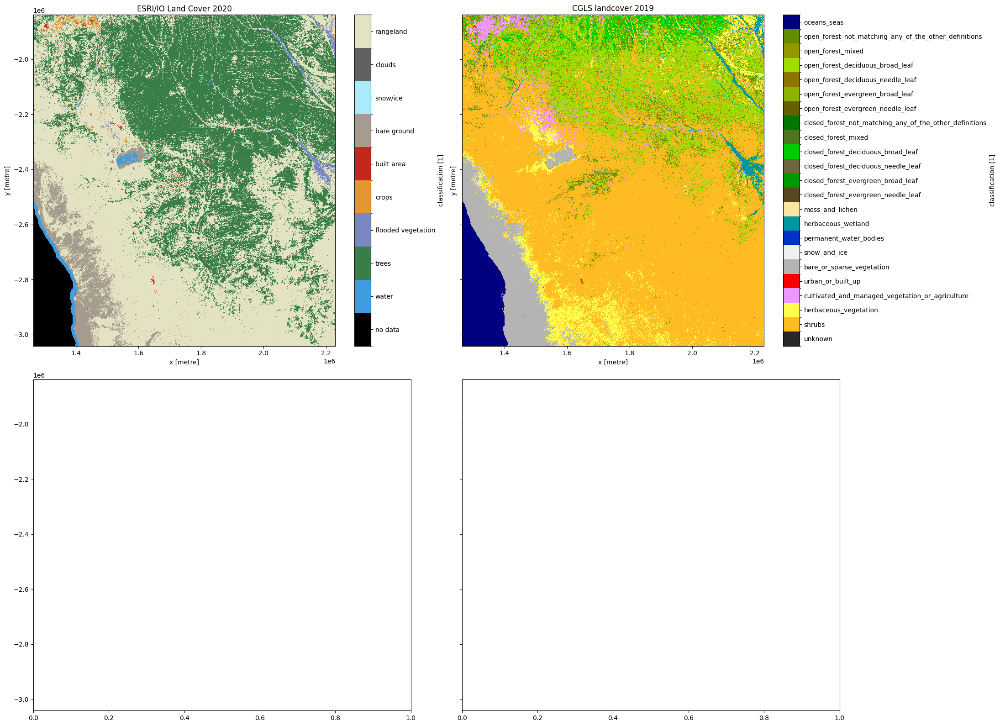

In [17]:
fig, ax = plt.subplots(2, 2, figsize=(22, 16), sharey=True)
plot_lulc(ds_io[measurements], product="IO", legend=True, ax=ax[0, 0])
plot_lulc(ds_cgls[measurements], product="CGLS", legend=True, ax=ax[0, 1])
ax[0, 0].set_title("ESRI/IO Land Cover 2020")
ax[0, 1].set_title("CGLS landcover 2019")
plt.tight_layout();

In [18]:
# separating CGLS layers

In [19]:
# first example for Shrubs category

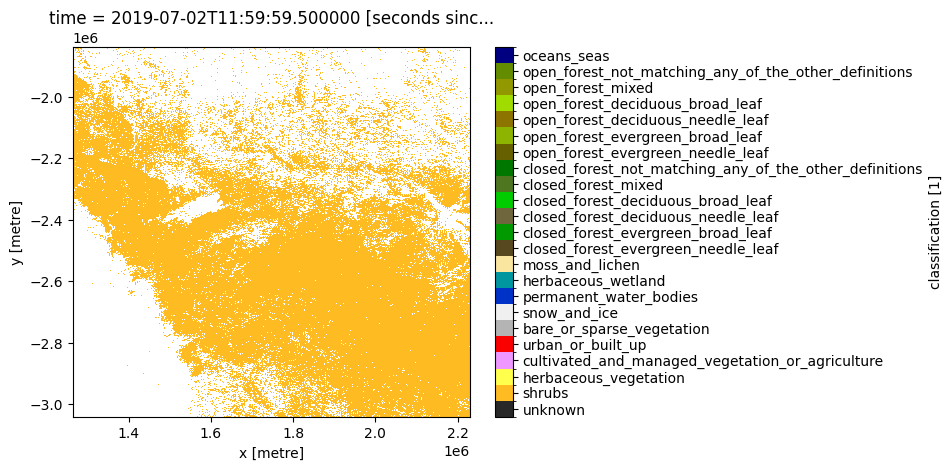

In [20]:
plot_lulc(ds_cgls.where(ds_cgls==20)[measurements], product="CGLS", legend=True)

In [21]:
cgls_shrubs = ds_cgls.where(ds_cgls==20)

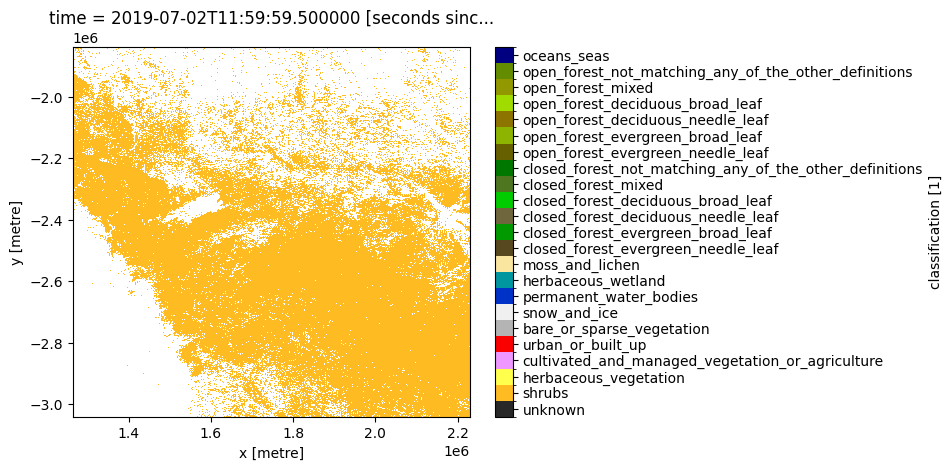

In [22]:
plot_lulc(cgls_shrubs[measurements], product="CGLS", legend=True)

In [23]:
# arraying the separated CGLS data

In [24]:
cgls_shrubs.classification

<xarray.DataArray 'classification' (y: 2405, x: 1931)>
array([[20., 20., nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., 20., 20., 20.],
       [nan, nan, nan, ..., 20., 20., 20.],
       [nan, nan, nan, ..., 20., 20., 20.]])
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

In [25]:
#installing necessary packages for Euc Dist

In [26]:
!pip install xarray-spatial


from xrspatial import proximity

/usr/local/lib/python3.8/dist-packages/dask/dataframe/utils.py:367: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/usr/local/lib/python3.8/dist-packages/dask/dataframe/utils.py:367: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)
/usr/local/lib/python3.8/dist-packages/dask/dataframe/utils.py:367: FutureWarning: pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _numeric_index_types = (pd.Int64Index, pd.Float64Index, pd.UInt64Index)


In [27]:
# running Euc Dist (can run without distance metric first to work out how to set the buffer smaller based on the output)

In [28]:
proximity_agg = proximity(cgls_shrubs.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[   0.    ,    0.    ,  500.    , ..., 2692.5825, 2915.4758,
        3201.562 ],
       [ 500.    ,  500.    ,  500.    , ..., 2236.0679, 2500.    ,
        2828.4272],
       [ 500.    ,  707.1068,  500.    , ..., 1802.7756, 2121.3203,
        2500.    ],
       ...,
       [      nan,       nan,       nan, ...,    0.    ,    0.    ,
           0.    ],
       [      nan,       nan,       nan, ...,    0.    ,    0.    ,
           0.    ],
       [      nan,       nan,       nan, ...,    0.    ,    0.    ,
           0.    ]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

In [29]:
# plotting euc dist

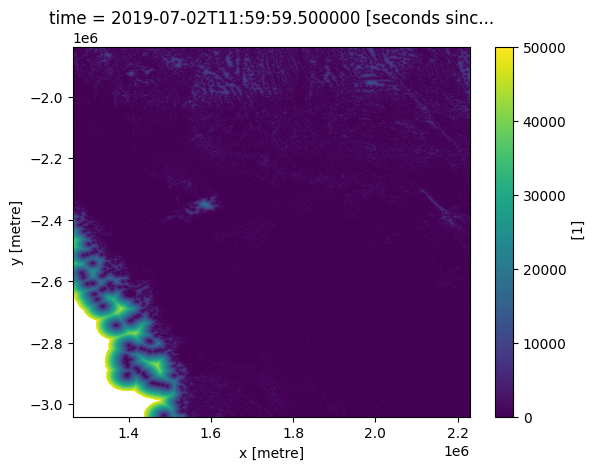

In [30]:
proximity_agg.plot()

In [31]:
proximity_aggstd = 1 - (proximity_agg/50000)

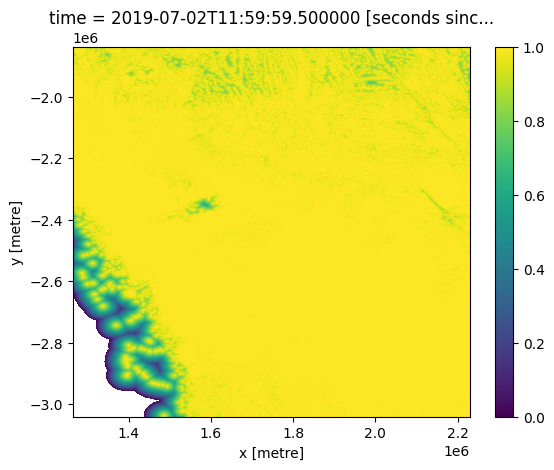

In [32]:
proximity_aggstd.plot()

In [33]:
# second example for crops

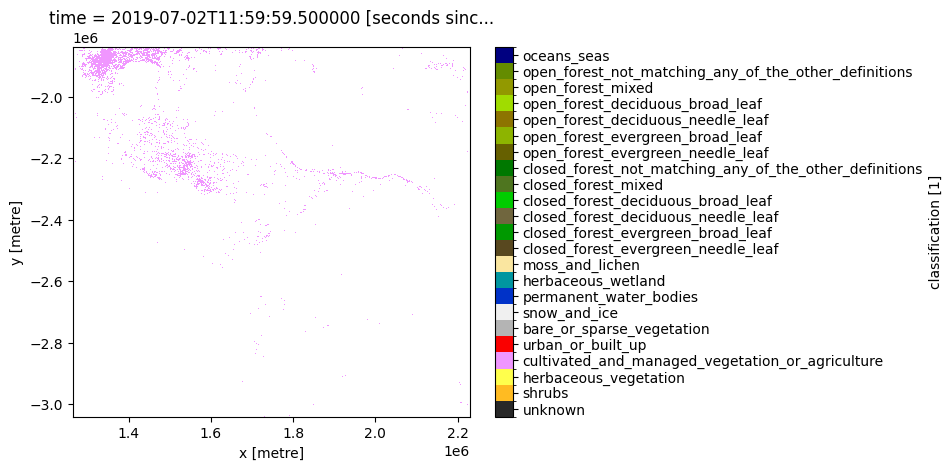

In [34]:
plot_lulc(ds_cgls.where(ds_cgls==40)[measurements], product="CGLS", legend=True)

In [35]:
cgls_crops = ds_cgls.where(ds_cgls==40)

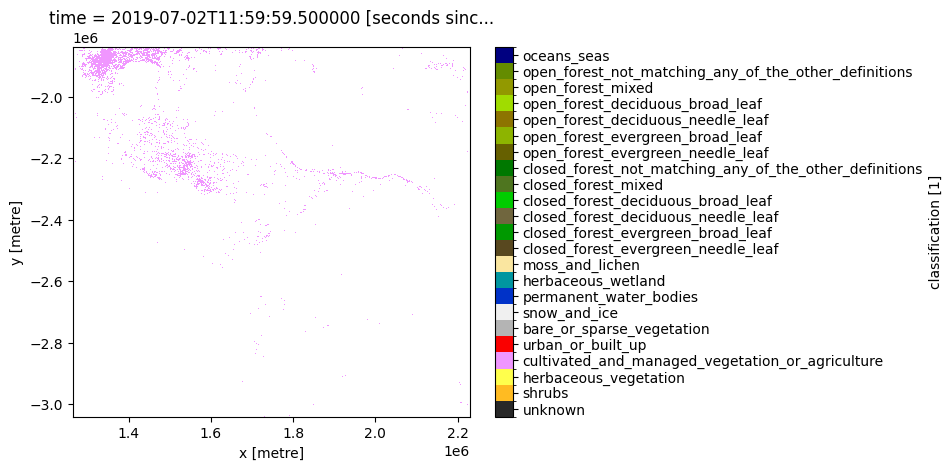

In [36]:
plot_lulc(cgls_crops[measurements], product="CGLS", legend=True)

In [37]:
proximity_crops = proximity(cgls_crops.classification, distance_metric = 'EUCLIDEAN')
proximity_crops

<xarray.DataArray (y: 2405, x: 1931)>
array([[  5024.938 ,   4527.6924,   4031.129 , ...,   9962.43  ,
         10124.229 ,  10307.764 ],
       [  5000.    ,   4500.    ,   4000.    , ...,   9486.833 ,
          9656.604 ,   9848.857 ],
       [  5024.938 ,   4527.6924,   4031.129 , ...,   9013.878 ,
          9192.388 ,   9394.147 ],
       ...,
       [262937.25  , 262663.75  , 262390.94  , ...,  15033.296 ,
         15532.225 ,  16031.22  ],
       [263355.75  , 263082.7   , 262810.28  , ...,  15008.331 ,
         15508.0625,  16007.811 ],
       [263774.53  , 263501.9   , 263229.94  , ...,  15000.    ,
         15500.    ,  16000.    ]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

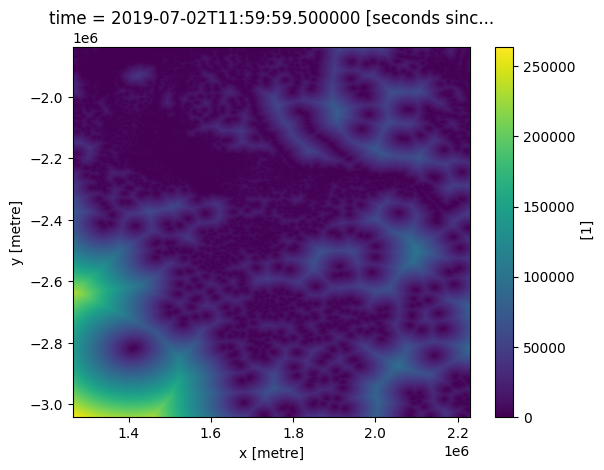

In [38]:
proximity_crops.plot()

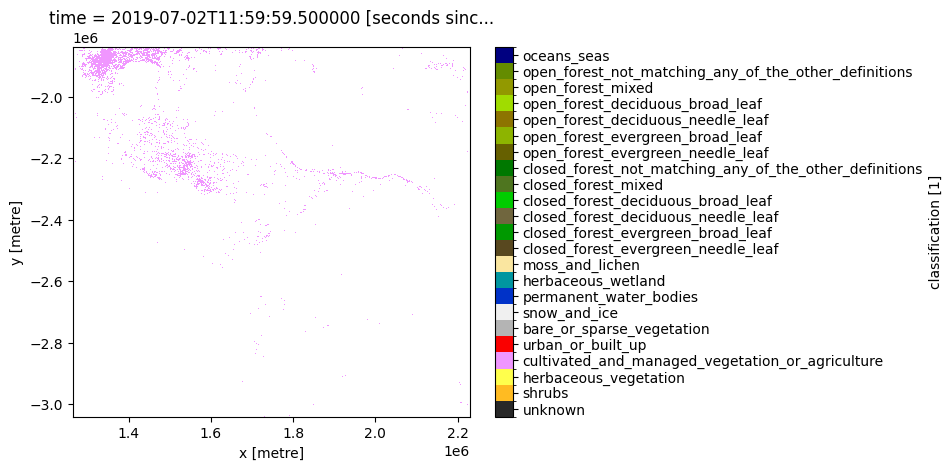

In [39]:
plot_lulc(ds_cgls.where(ds_cgls==40)[measurements], product="CGLS", legend=True)

In [40]:
proximity_agg = proximity(cgls_crops.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[ 5024.938 ,  4527.6924,  4031.129 , ...,  9962.43  , 10124.229 ,
        10307.764 ],
       [ 5000.    ,  4500.    ,  4000.    , ...,  9486.833 ,  9656.604 ,
         9848.857 ],
       [ 5024.938 ,  4527.6924,  4031.129 , ...,  9013.878 ,  9192.388 ,
         9394.147 ],
       ...,
       [       nan,        nan,        nan, ..., 15033.296 , 15532.225 ,
        16031.22  ],
       [       nan,        nan,        nan, ..., 15008.331 , 15508.0625,
        16007.811 ],
       [       nan,        nan,        nan, ..., 15000.    , 15500.    ,
        16000.    ]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

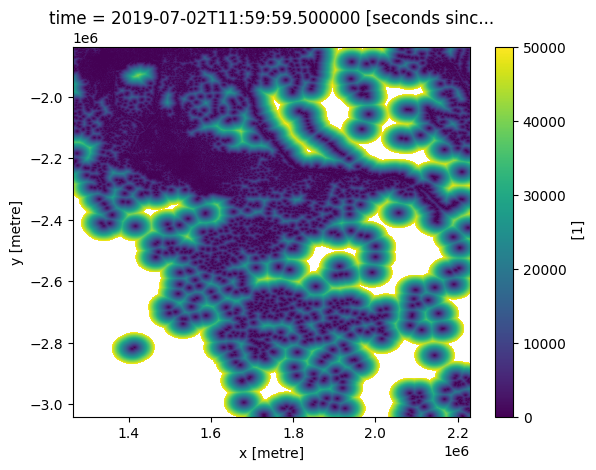

In [41]:
proximity_agg.plot()

In [42]:
proximity_aggstd = 1 - (proximity_agg/50000)

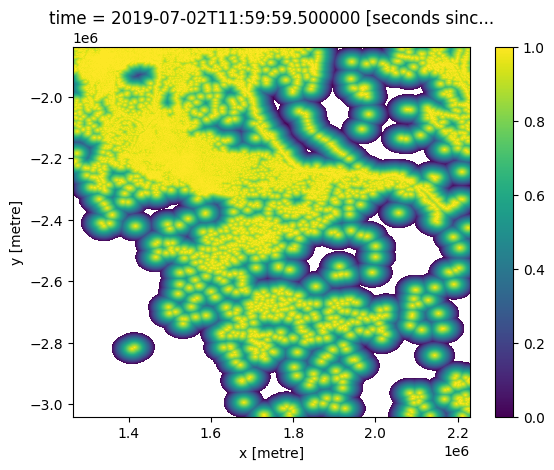

In [43]:
proximity_aggstd.plot()

In [44]:
# ocean

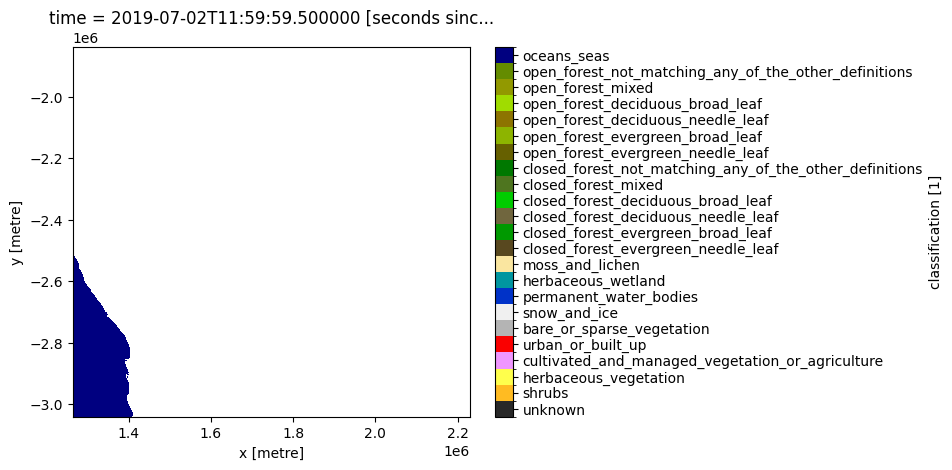

In [45]:
plot_lulc(ds_cgls.where(ds_cgls==200)[measurements], product="CGLS", legend=True)

In [46]:
cgls_ocean = ds_cgls.where(ds_cgls==200)

In [47]:
cgls_ocean.classification

<xarray.DataArray 'classification' (y: 2405, x: 1931)>
array([[ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       ...,
       [200., 200., 200., ...,  nan,  nan,  nan],
       [200., 200., 200., ...,  nan,  nan,  nan],
       [200., 200., 200., ...,  nan,  nan,  nan]])
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

In [48]:
proximity_agg = proximity(cgls_ocean.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [ 0.,  0.,  0., ..., nan, nan, nan],
       [ 0.,  0.,  0., ..., nan, nan, nan],
       [ 0.,  0.,  0., ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

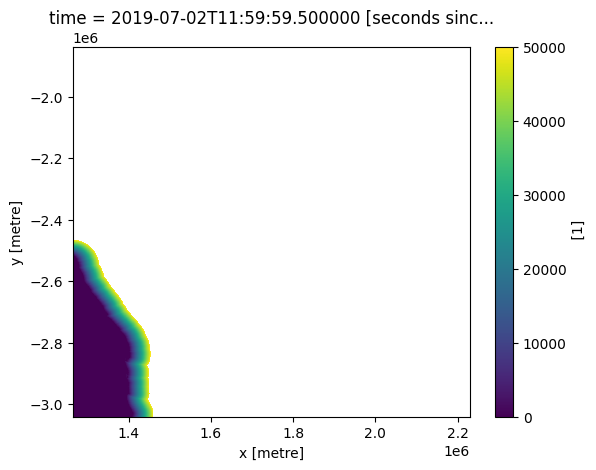

In [49]:
proximity_agg.plot()

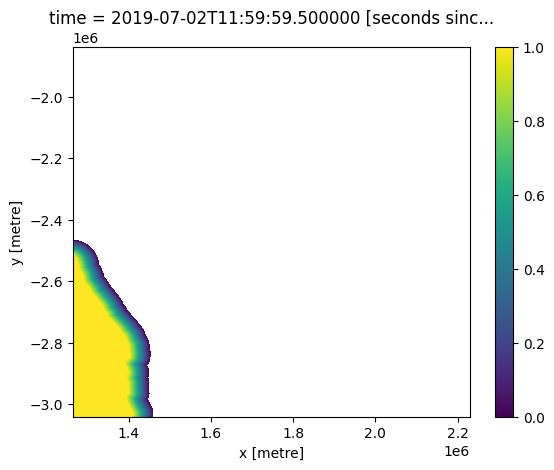

In [50]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [51]:
# sparse and bare veg

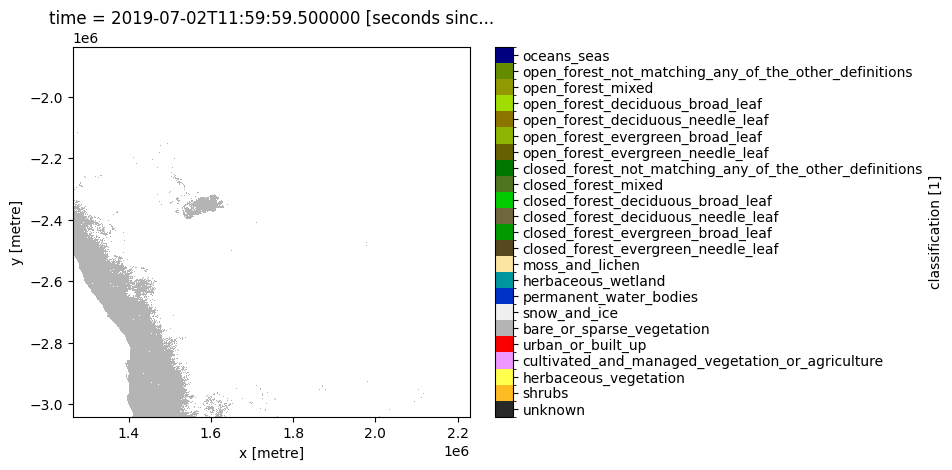

In [52]:
plot_lulc(ds_cgls.where(ds_cgls==60)[measurements], product="CGLS", legend=True)

In [53]:
cgls_sparse = ds_cgls.where(ds_cgls==60)

In [54]:
proximity_agg = proximity(cgls_sparse.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       ...,
       [      nan,       nan,       nan, ..., 32175.3  , 32534.598,
        32897.566],
       [      nan,       nan,       nan, ..., 32526.912, 32882.367,
        33241.54 ],
       [      nan,       nan,       nan, ..., 32882.367, 33234.02 ,
        33589.434]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

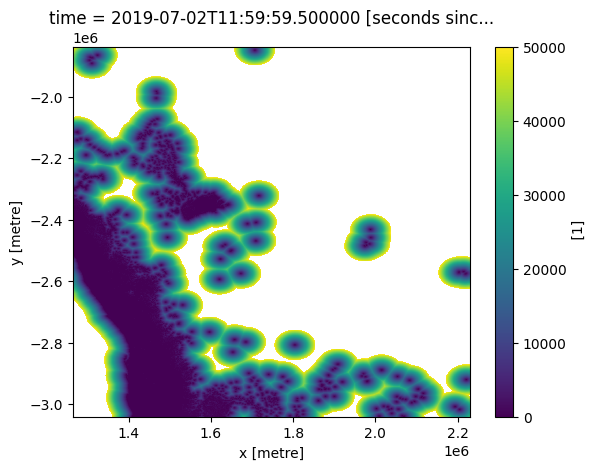

In [55]:
proximity_agg.plot()

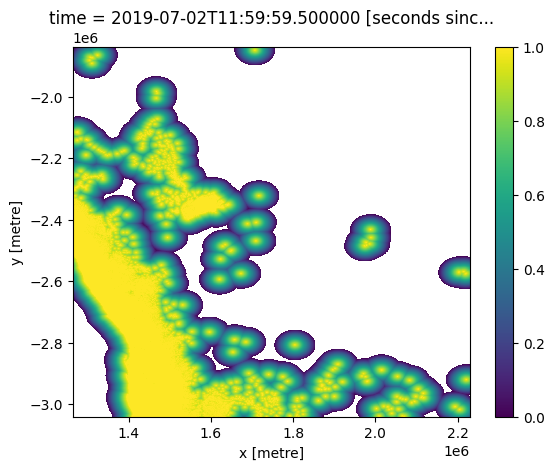

In [56]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [57]:
# urban development

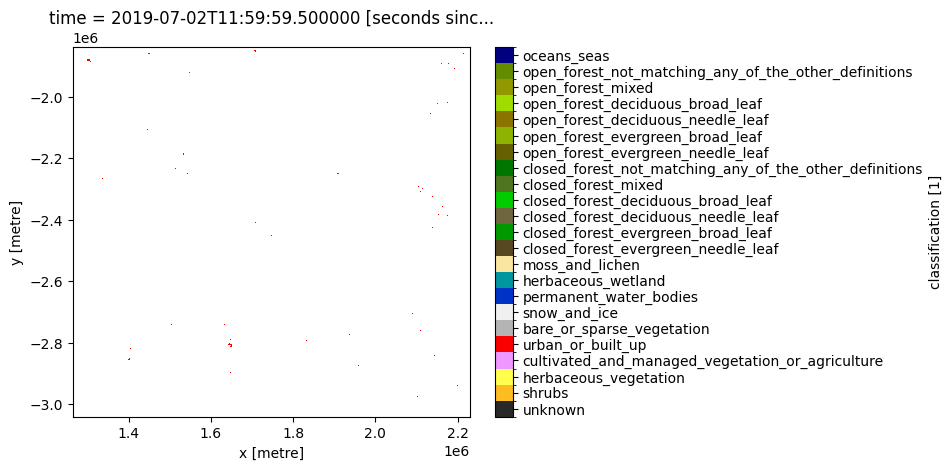

In [58]:
plot_lulc(ds_cgls.where(ds_cgls==50)[measurements], product="CGLS", legend=True)

In [59]:
cgls_urban = ds_cgls.where(ds_cgls==50)

In [60]:
proximity_agg = proximity(cgls_urban.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[33941.125 , 33589.434 , 33241.54  , ...,  7158.9106,  7382.4116,
         7632.169 ],
       [33589.434 , 33234.02  , 32882.367 , ...,  6708.204 ,  6946.222 ,
         7211.1025],
       [33241.54  , 32882.367 , 32526.912 , ...,  6264.982 ,  6519.2026,
         6800.7354],
       ...,
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

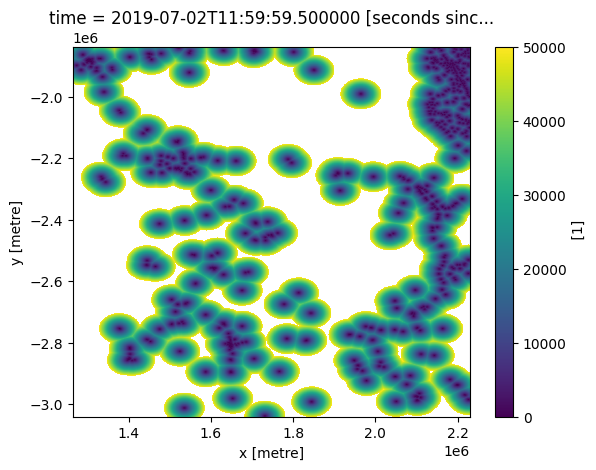

In [61]:
proximity_agg.plot()

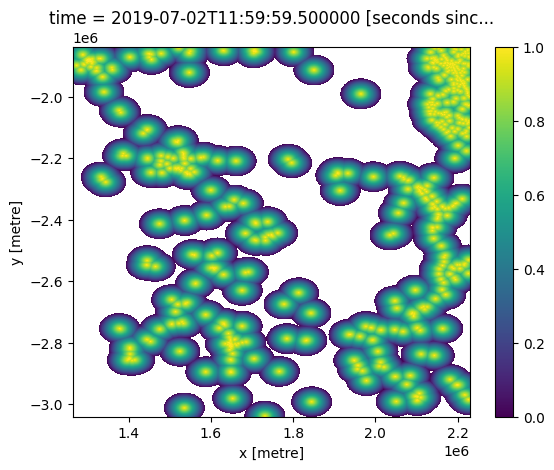

In [62]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [63]:
# herbaceous wetland

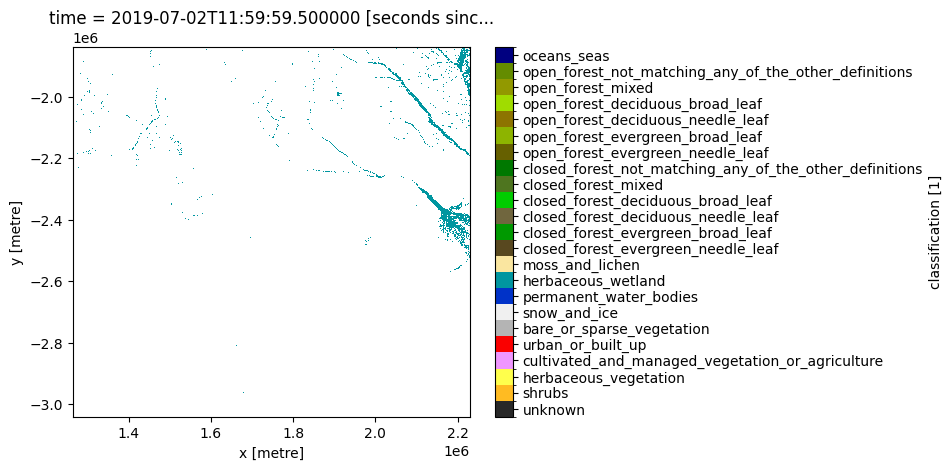

In [64]:
plot_lulc(ds_cgls.where(ds_cgls==90)[measurements], product="CGLS", legend=True)

In [65]:
cgls_wetland = ds_cgls.where(ds_cgls==90)

In [66]:
proximity_agg = proximity(cgls_wetland.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[44300.113, 43832.066, 43364.73 , ...,     0.   ,     0.   ,
            0.   ],
       [44127.656, 43657.76 , 43188.54 , ...,   500.   ,   500.   ,
            0.   ],
       [43960.21 , 43488.504, 43017.438, ...,   500.   ,     0.   ,
          500.   ],
       ...,
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

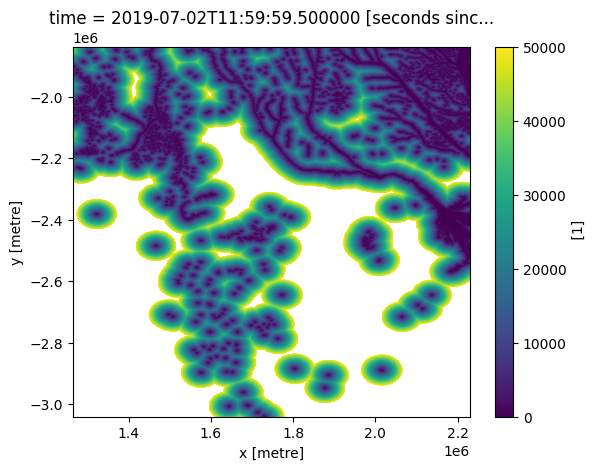

In [67]:
proximity_agg.plot()

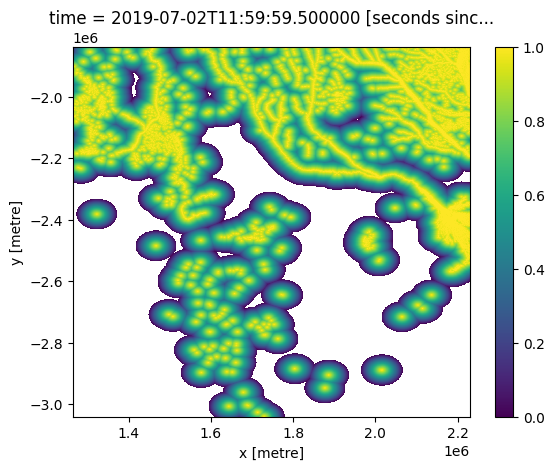

In [68]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [69]:
# herbaceous vegetation

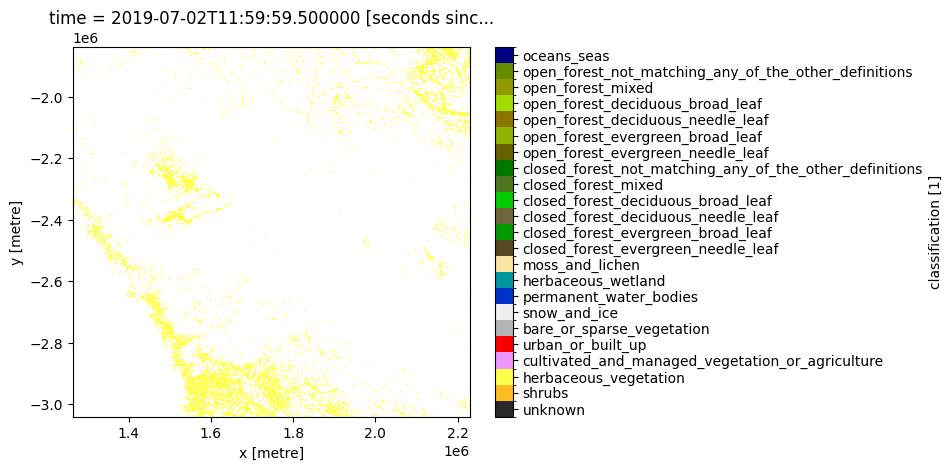

In [70]:
plot_lulc(ds_cgls.where(ds_cgls==30)[measurements], product="CGLS", legend=True)

In [71]:
cgls_hveg = ds_cgls.where(ds_cgls==30)

In [72]:
proximity_agg = proximity(cgls_hveg.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[7810.2495, 7500.    , 7211.1025, ...,  500.    ,  707.1068,
        1118.0339],
       [7433.034 , 7106.335 , 6800.7354, ...,    0.    ,  500.    ,
        1000.    ],
       [7071.068 , 6726.812 , 6403.124 , ...,  500.    ,  500.    ,
         500.    ],
       ...,
       [      nan,       nan,       nan, ..., 4123.1055, 4609.7725,
        5099.0195],
       [      nan,       nan,       nan, ..., 4031.129 , 4527.6924,
        5024.938 ],
       [      nan,       nan,       nan, ..., 4000.    , 4500.    ,
        5000.    ]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

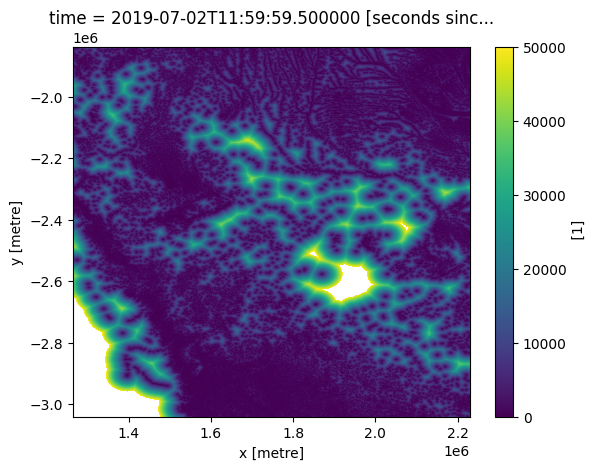

In [73]:
proximity_agg.plot()

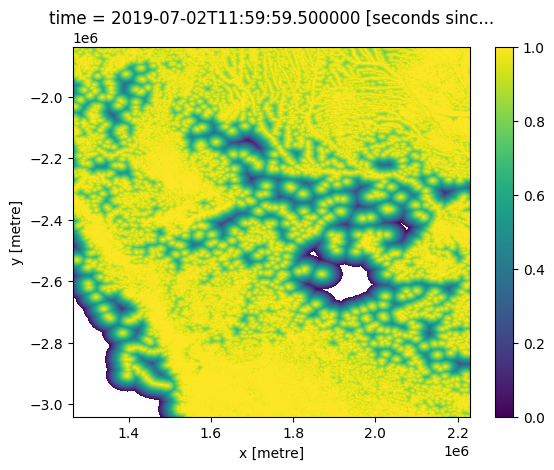

In [74]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [75]:
# snow and ice

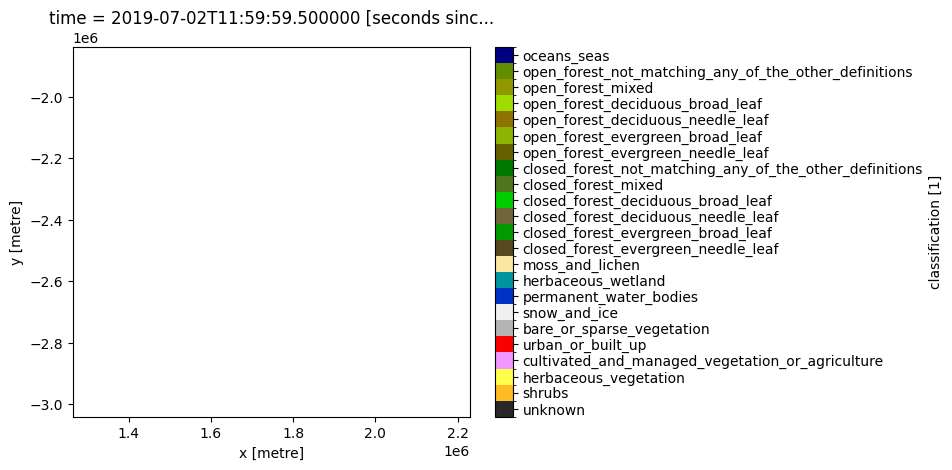

In [76]:
plot_lulc(ds_cgls.where(ds_cgls==70)[measurements], product="CGLS", legend=True)

In [77]:
cgls_ice = ds_cgls.where(ds_cgls==70)

In [78]:
proximity_agg = proximity(cgls_ice.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

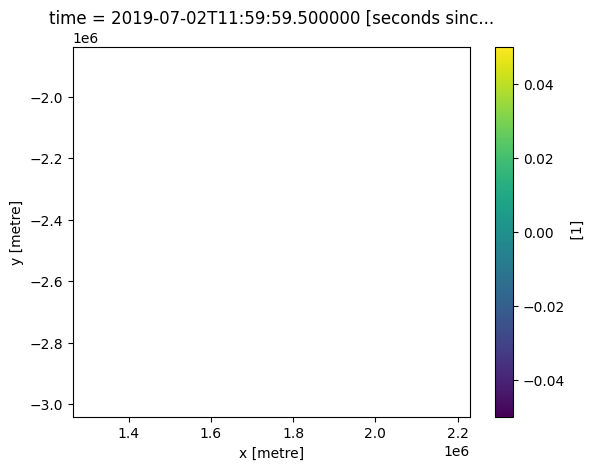

In [79]:
proximity_agg.plot()

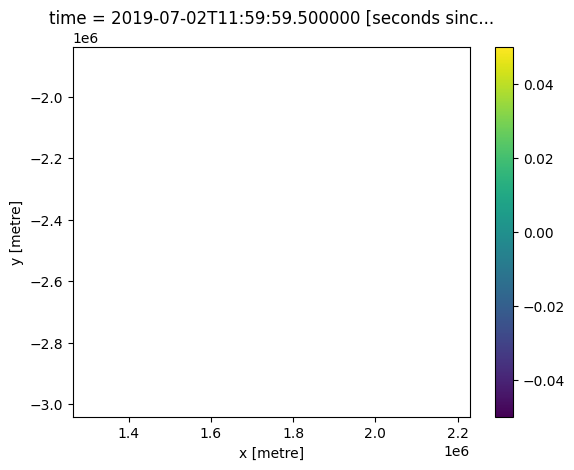

In [80]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [81]:
# permanent water

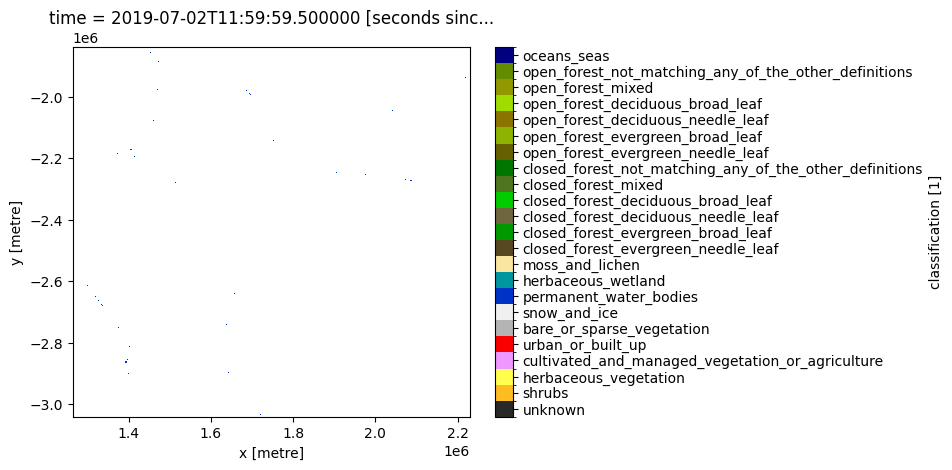

In [82]:
plot_lulc(ds_cgls.where(ds_cgls==80)[measurements], product="CGLS", legend=True)

In [83]:
cgls_pwater = ds_cgls.where(ds_cgls==80)

In [84]:
proximity_agg = proximity(cgls_pwater.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[      nan,       nan,       nan, ..., 4000.    , 4500.    ,
        4527.6924],
       [      nan,       nan,       nan, ..., 4031.129 , 4000.    ,
        4031.129 ],
       [      nan,       nan,       nan, ..., 3535.534 , 3500.    ,
        3535.534 ],
       ...,
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

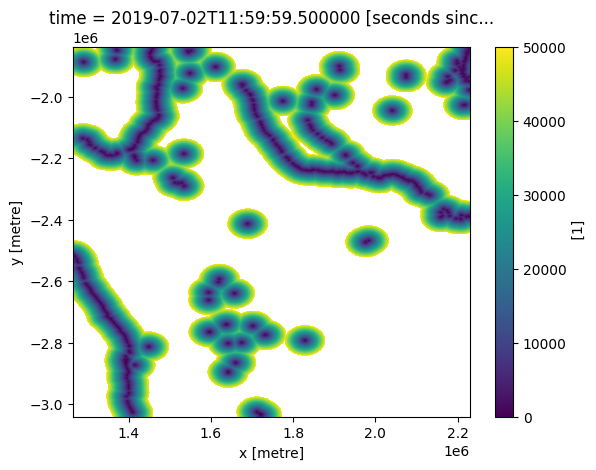

In [85]:
proximity_agg.plot()

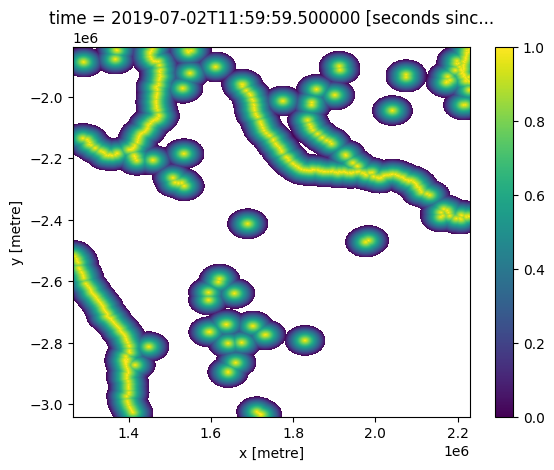

In [86]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [87]:
# moss and lichen

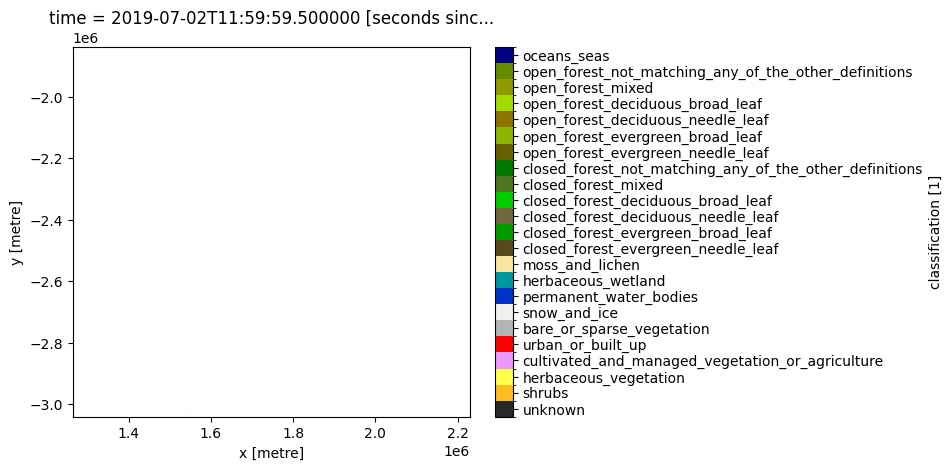

In [88]:
plot_lulc(ds_cgls.where(ds_cgls==100)[measurements], product="CGLS", legend=True)

In [89]:
cgls_moss = ds_cgls.where(ds_cgls==100)

In [90]:
proximity_agg = proximity(cgls_moss.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

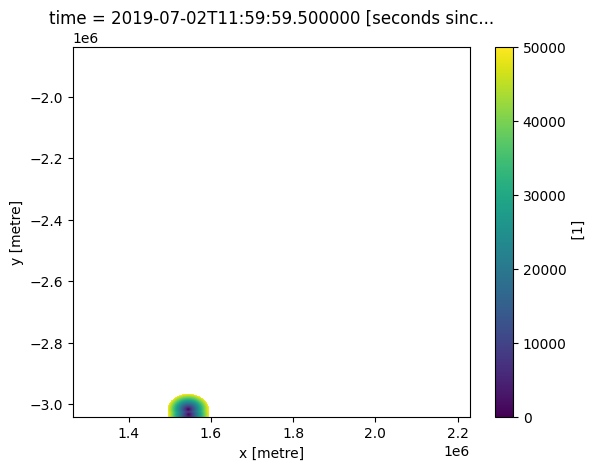

In [91]:
proximity_agg.plot()

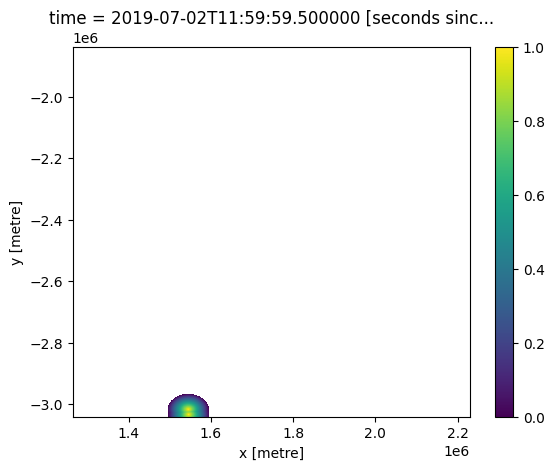

In [92]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [93]:
# closed forest evergreen needle leaf

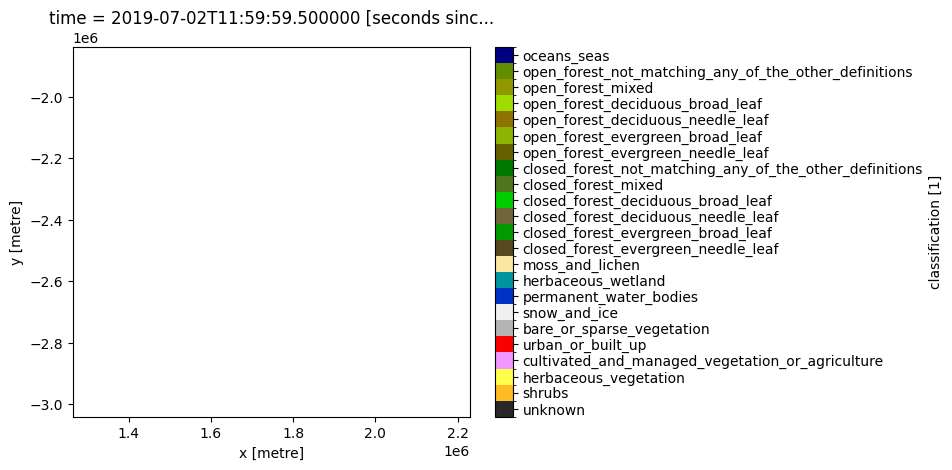

In [94]:
plot_lulc(ds_cgls.where(ds_cgls==111)[measurements], product="CGLS", legend=True)

In [95]:
cgls_cforestenl = ds_cgls.where(ds_cgls==111)

In [96]:
proximity_agg = proximity(cgls_cforestenl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

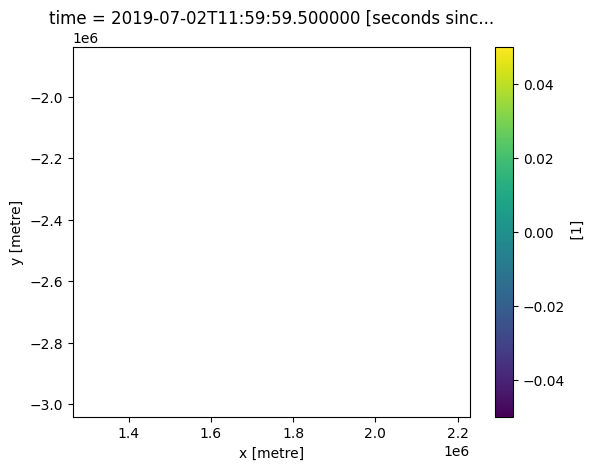

In [97]:
proximity_agg.plot()

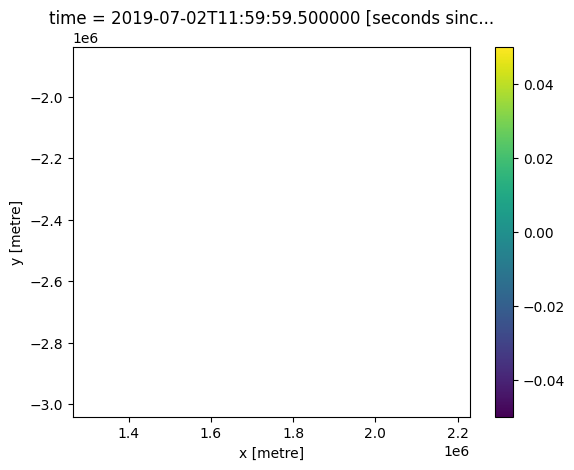

In [98]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [99]:
# closed forest evergreen broadleaf

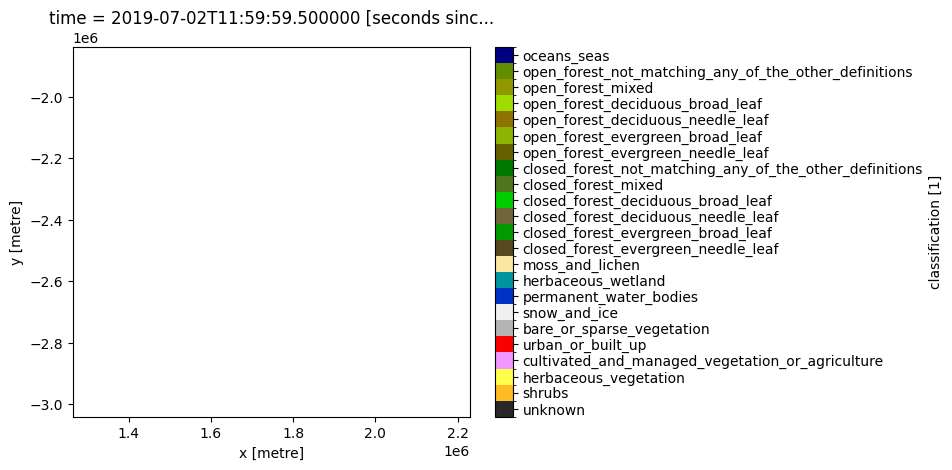

In [100]:
plot_lulc(ds_cgls.where(ds_cgls==112)[measurements], product="CGLS", legend=True)

In [101]:
cgls_cforestebl = ds_cgls.where(ds_cgls==112)

In [102]:
proximity_agg = proximity(cgls_cforestebl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

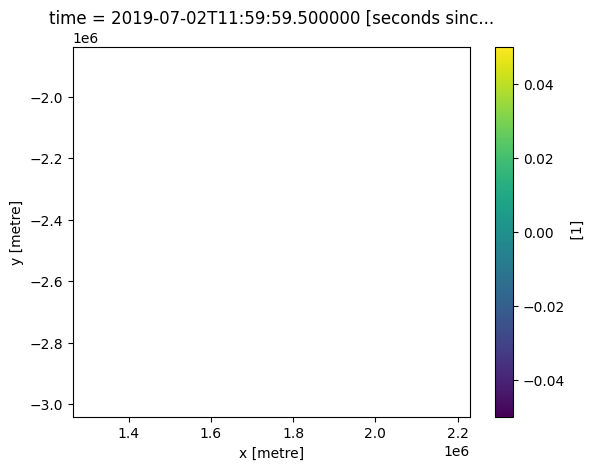

In [103]:
proximity_agg.plot()

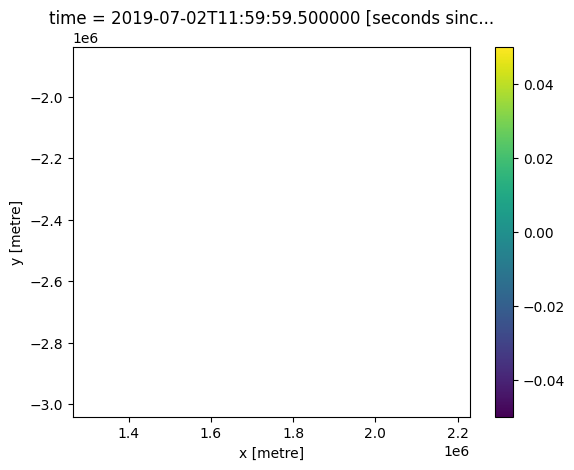

In [104]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [105]:
# closed forest deciduous needle leaf

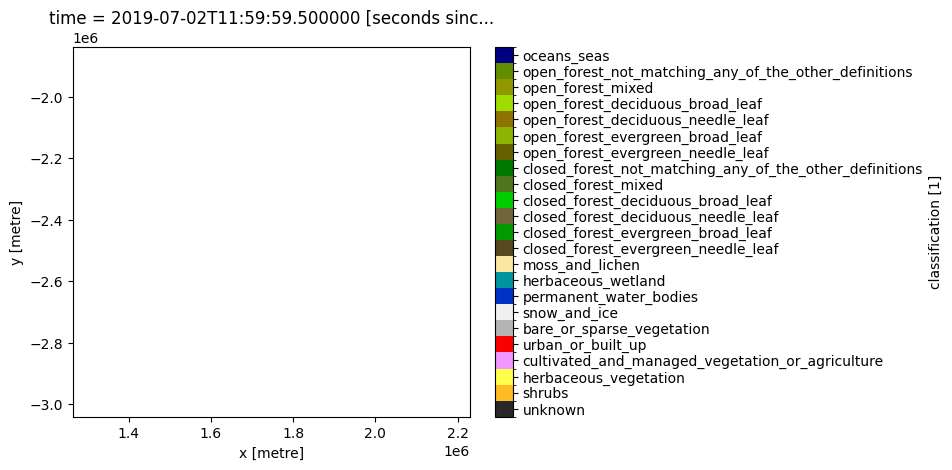

In [106]:
plot_lulc(ds_cgls.where(ds_cgls==113)[measurements], product="CGLS", legend=True)

In [107]:
cgls_cforestdnl = ds_cgls.where(ds_cgls==113)

In [108]:
proximity_agg = proximity(cgls_cforestdnl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

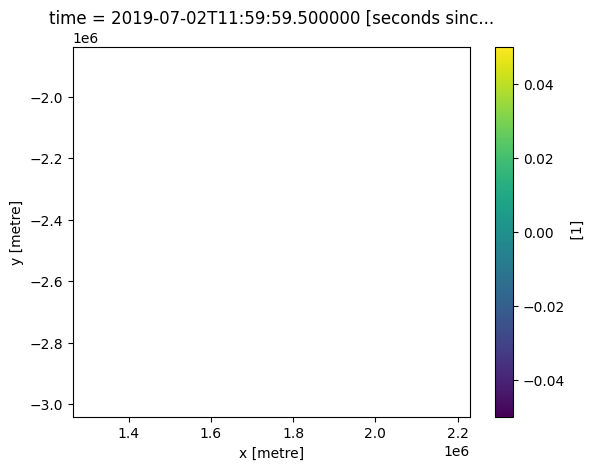

In [109]:
proximity_agg.plot()

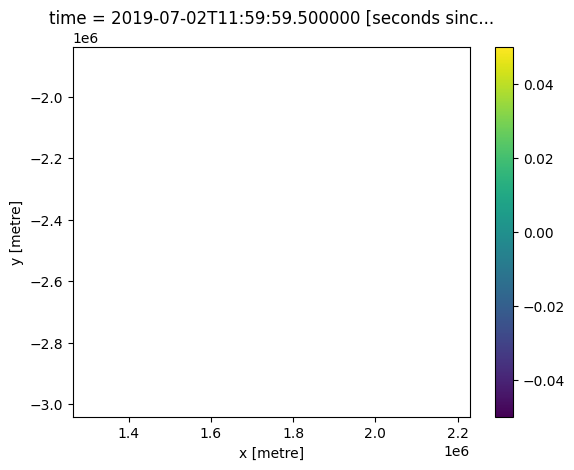

In [110]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [111]:
# closed forest deciduous broadleaf

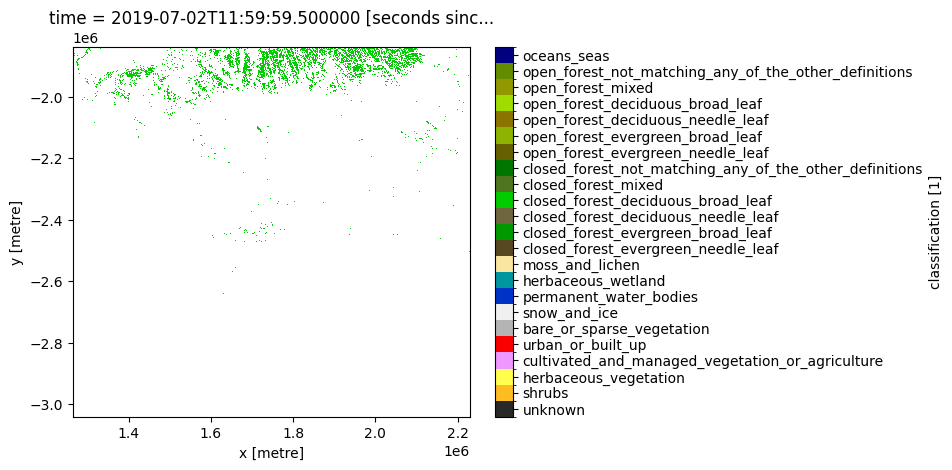

In [112]:
plot_lulc(ds_cgls.where(ds_cgls==114)[measurements], product="CGLS", legend=True)

In [113]:
cgls_cforestdbl = ds_cgls.where(ds_cgls==114)

In [114]:
proximity_agg = proximity(cgls_cforestdbl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[15033.296 , 15008.331 , 15000.    , ...,  6519.2026,  7017.8345,
         7516.648 ],
       [14534.441 , 14508.618 , 14500.    , ...,  6500.    ,  7000.    ,
         7500.    ],
       [14035.669 , 14008.926 , 14000.    , ...,  6500.    ,  7000.    ,
         7500.    ],
       ...,
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

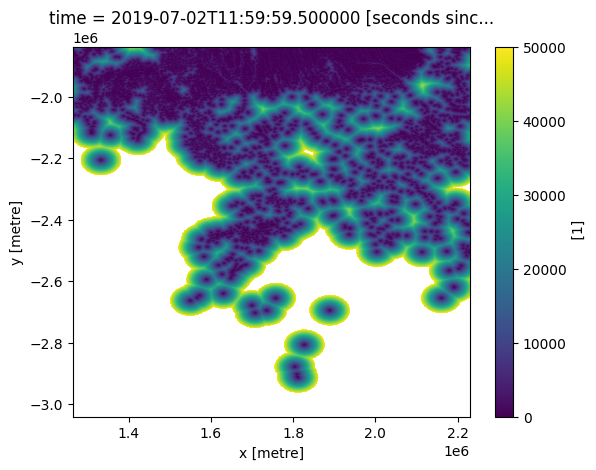

In [115]:
proximity_agg.plot()

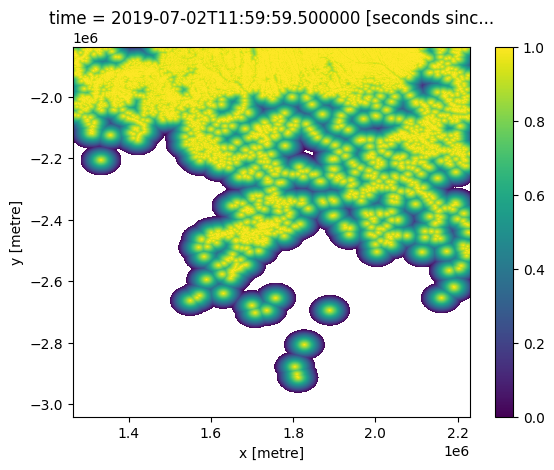

In [116]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [117]:
# closed forest mixed

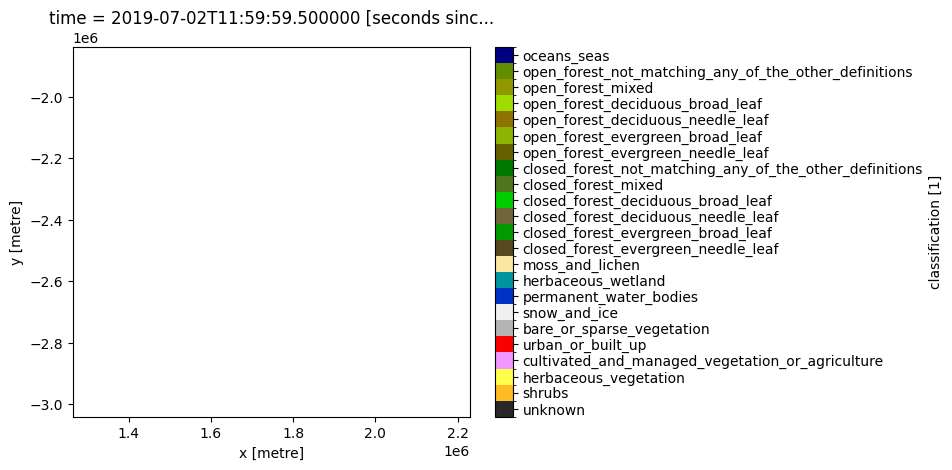

In [118]:
plot_lulc(ds_cgls.where(ds_cgls==115)[measurements], product="CGLS", legend=True)

In [119]:
cgls_cforestm = ds_cgls.where(ds_cgls==115)

In [120]:
proximity_agg = proximity(cgls_cforestm.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

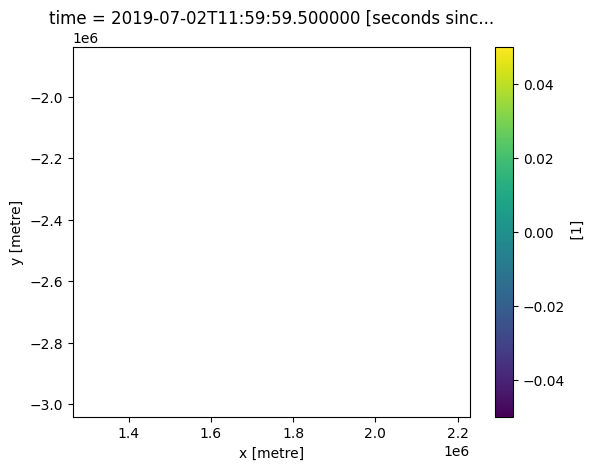

In [121]:
proximity_agg.plot()

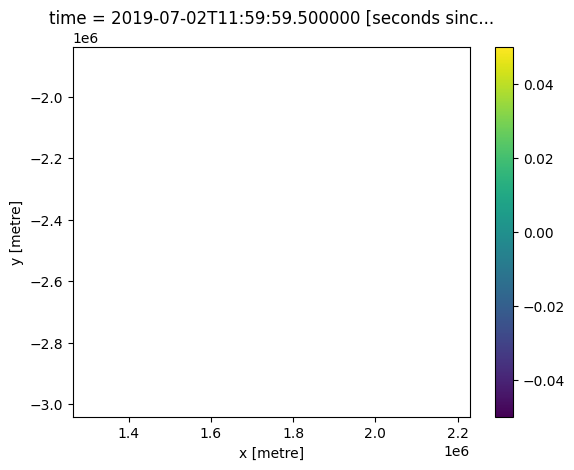

In [122]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [123]:
# closed forest unknown

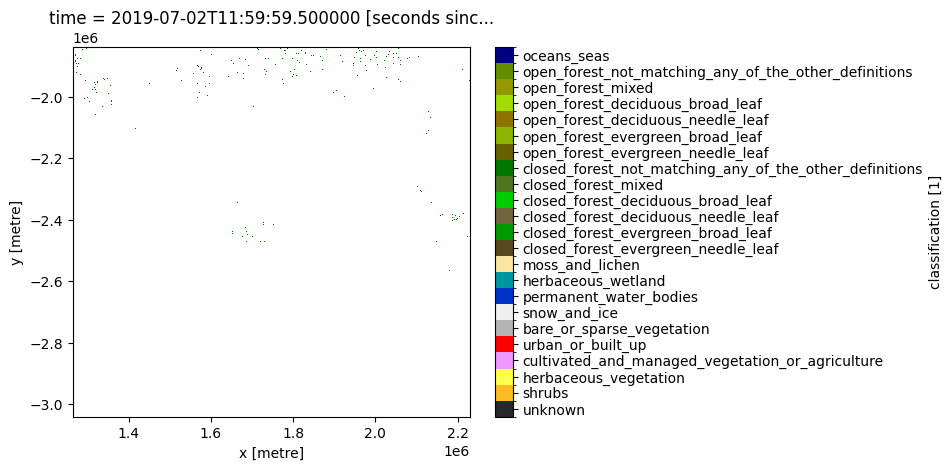

In [124]:
plot_lulc(ds_cgls.where(ds_cgls==116)[measurements], product="CGLS", legend=True)

In [125]:
cgls_cforestu = ds_cgls.where(ds_cgls==116)

In [126]:
proximity_agg = proximity(cgls_cforestu.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[14807.093 , 14713.939 , 14637.281 , ...,  7905.6943,  8381.527 ,
         8860.022 ],
       [14317.821 , 14221.463 , 14142.136 , ...,  7762.0874,  8246.211 ,
         8732.125 ],
       [13829.316 , 13729.53  , 13647.344 , ...,  7648.5293,  8139.41  ,
         8631.338 ],
       ...,
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

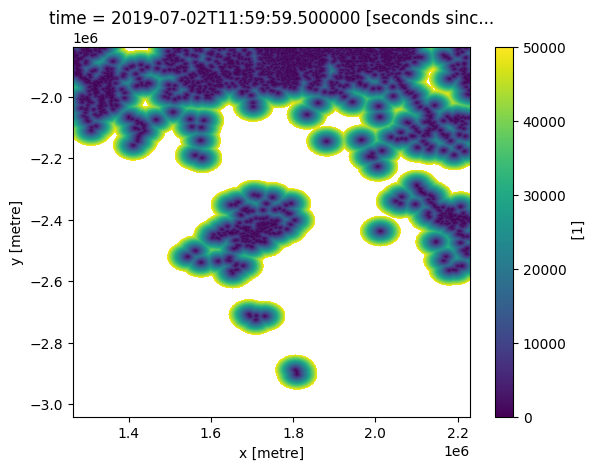

In [127]:
proximity_agg.plot()

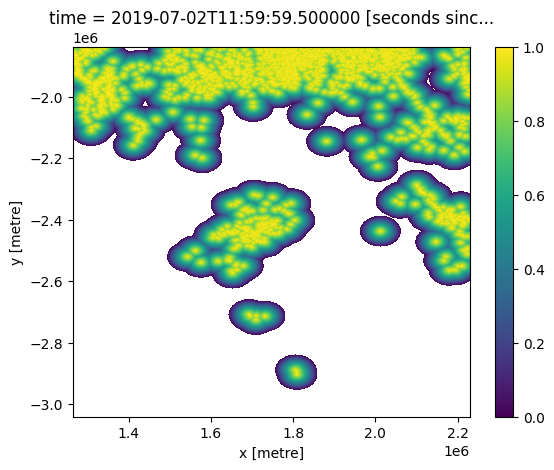

In [128]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [129]:
# open forest evergreen needle leaf

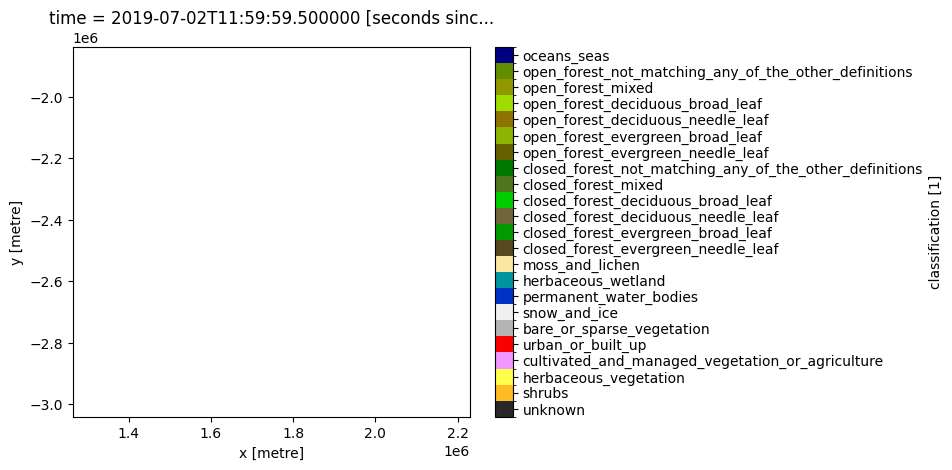

In [130]:
plot_lulc(ds_cgls.where(ds_cgls==121)[measurements], product="CGLS", legend=True)

In [131]:
cgls_oforestenl = ds_cgls.where(ds_cgls==121)

In [132]:
proximity_agg = proximity(cgls_oforestenl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

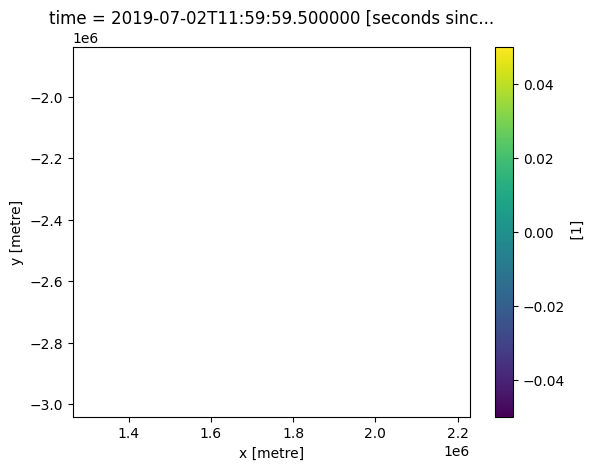

In [133]:
proximity_agg.plot()

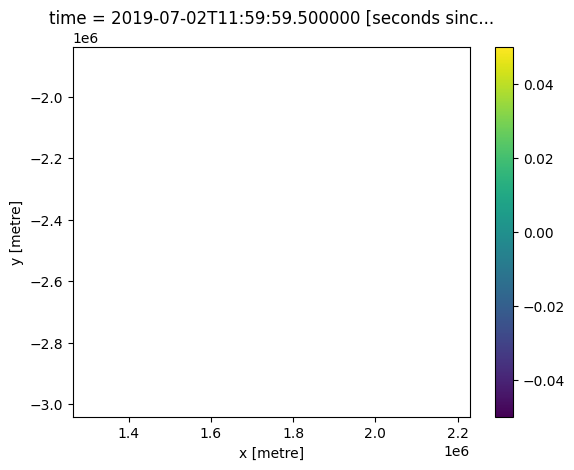

In [134]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [135]:
# open forest evergreen broadleaf

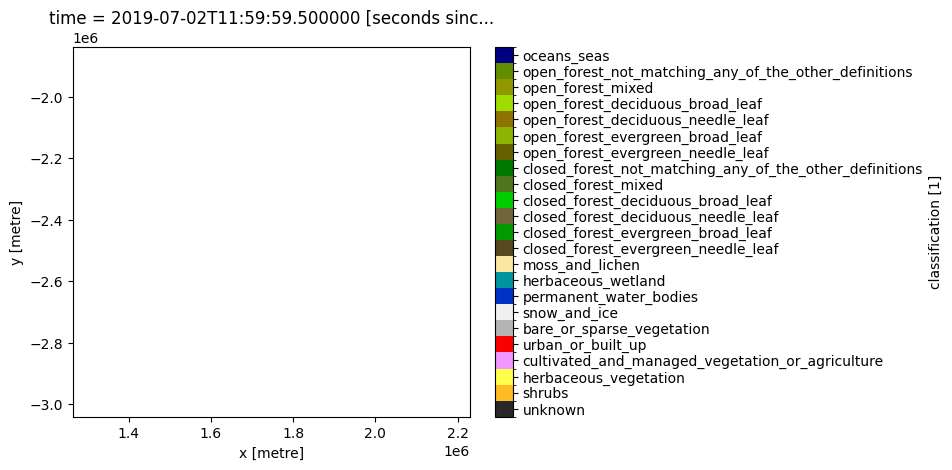

In [136]:
plot_lulc(ds_cgls.where(ds_cgls==122)[measurements], product="CGLS", legend=True)

In [137]:
cgls_oforestebl = ds_cgls.where(ds_cgls==122)

In [138]:
proximity_agg = proximity(cgls_oforestebl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

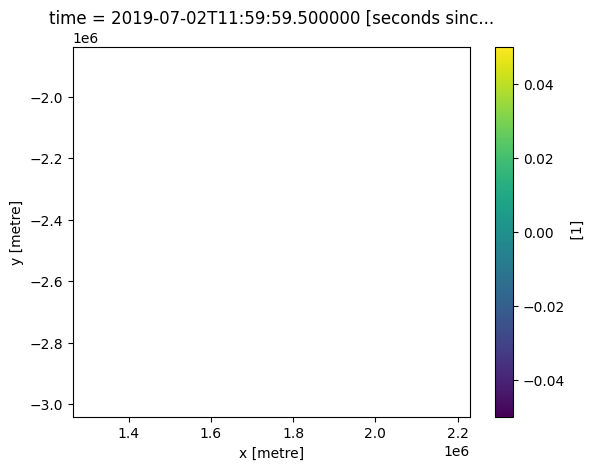

In [139]:
proximity_agg.plot()

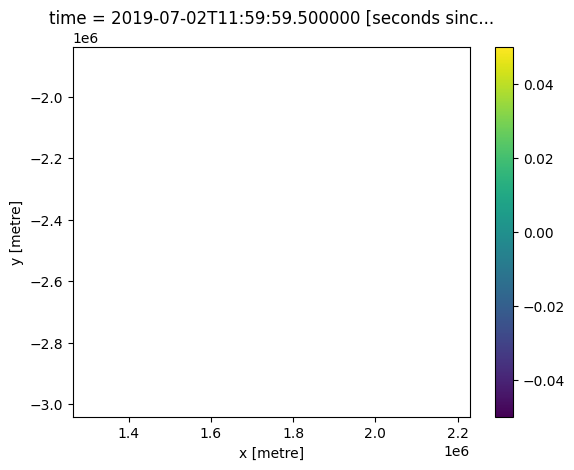

In [140]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [141]:
# open forest deciduous needle leaf

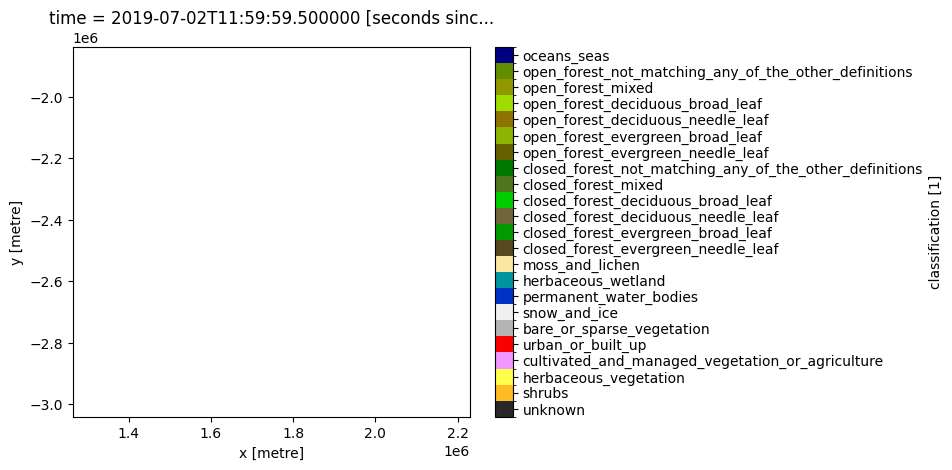

In [142]:
plot_lulc(ds_cgls.where(ds_cgls==123)[measurements], product="CGLS", legend=True)

In [143]:
cgls_oforestdnl = ds_cgls.where(ds_cgls==123)

In [144]:
proximity_agg = proximity(cgls_oforestdnl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

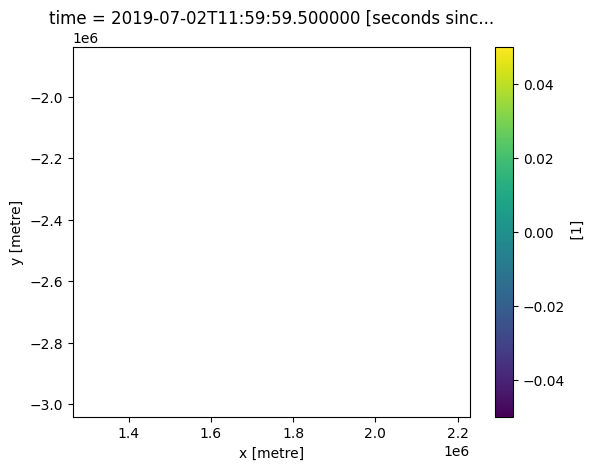

In [145]:
proximity_agg.plot()

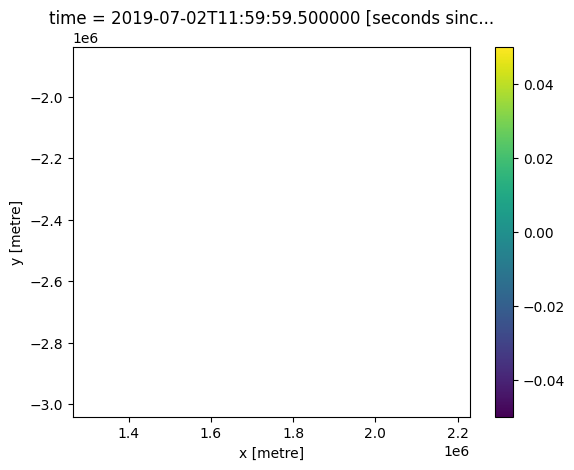

In [146]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [147]:
# open forest deciduous broad leaf

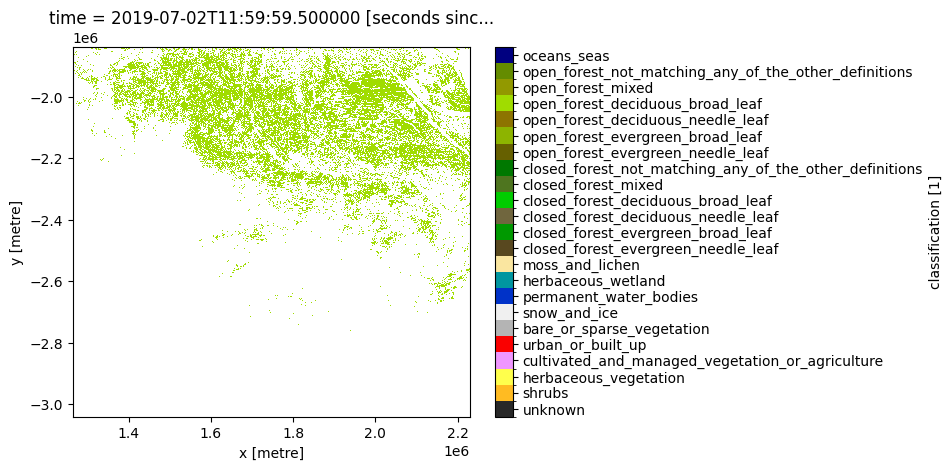

In [148]:
plot_lulc(ds_cgls.where(ds_cgls==124)[measurements], product="CGLS", legend=True)

In [149]:
cgls_oforestdbl = ds_cgls.where(ds_cgls==124)

In [150]:
proximity_agg = proximity(cgls_oforestdbl.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[1000.    ,  500.    ,    0.    , ...,  707.1068,  500.    ,
         707.1068],
       [1118.0339,  707.1068,  500.    , ...,  500.    ,    0.    ,
         500.    ],
       [1414.2136, 1118.0339, 1000.    , ...,  707.1068,  500.    ,
         707.1068],
       ...,
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

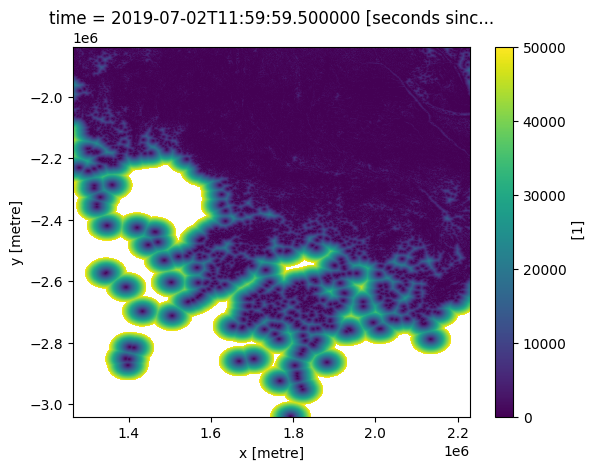

In [151]:
proximity_agg.plot()

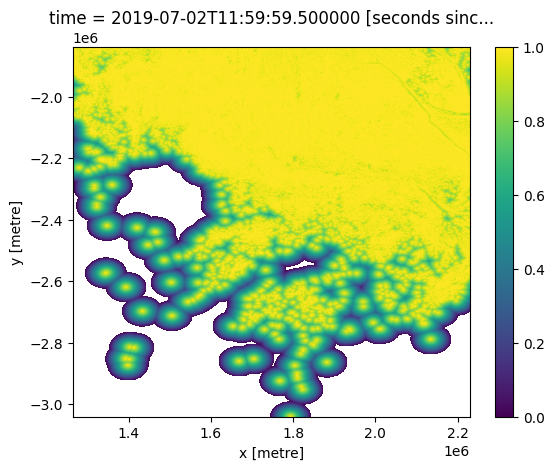

In [152]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [153]:
# open forest mixed

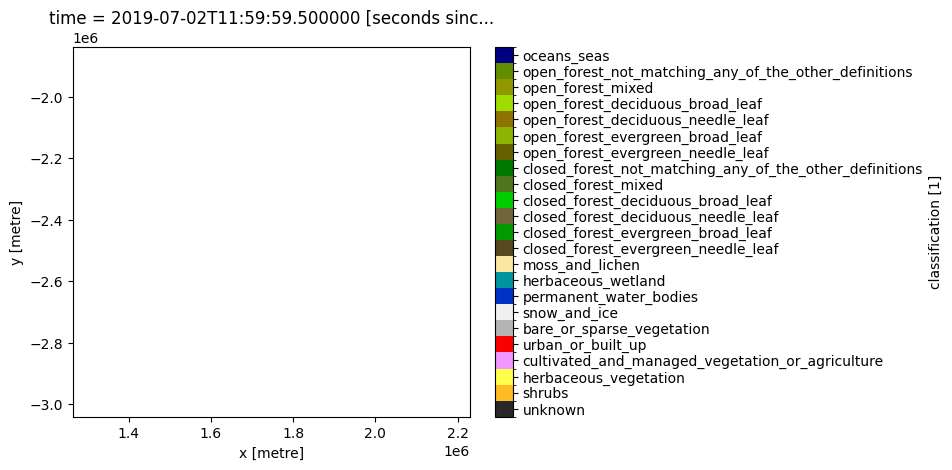

In [154]:
plot_lulc(ds_cgls.where(ds_cgls==125)[measurements], product="CGLS", legend=True)

In [155]:
cgls_oforestm = ds_cgls.where(ds_cgls==125)

In [156]:
proximity_agg = proximity(cgls_oforestm.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

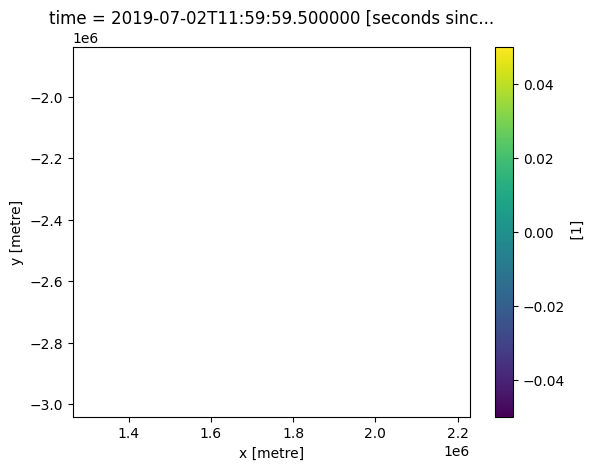

In [157]:
proximity_agg.plot()

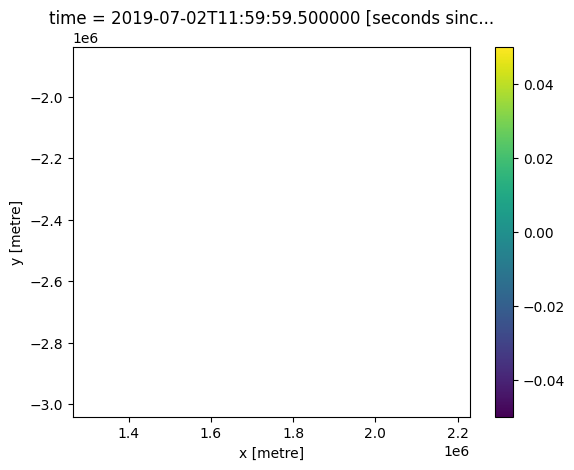

In [158]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [159]:
# open forest unknown

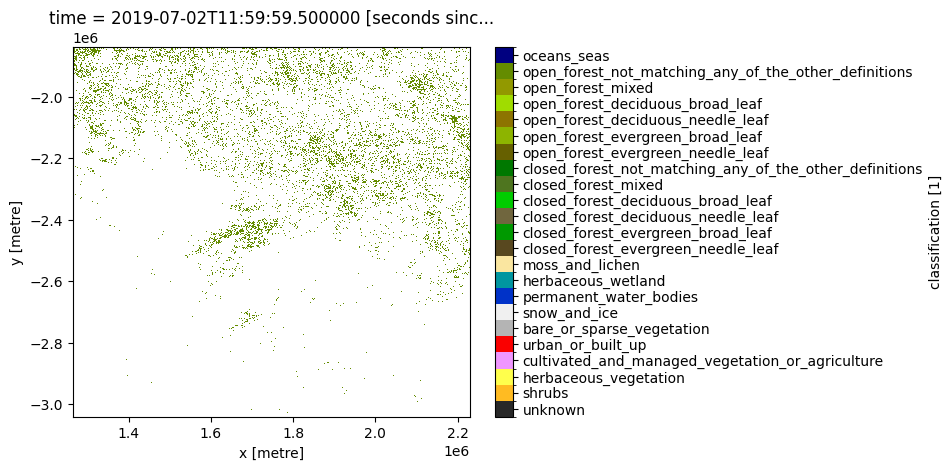

In [160]:
plot_lulc(ds_cgls.where(ds_cgls==126)[measurements], product="CGLS", legend=True)

In [161]:
cgls_oforestu = ds_cgls.where(ds_cgls==126)

In [162]:
proximity_agg = proximity(cgls_oforestu.classification, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[ 500.    ,  500.    ,  500.    , ..., 1000.    , 1118.0339,
        1000.    ],
       [   0.    ,    0.    ,    0.    , ...,  500.    ,  707.1068,
         500.    ],
       [   0.    ,    0.    ,    0.    , ...,    0.    ,  500.    ,
           0.    ],
       ...,
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan],
       [      nan,       nan,       nan, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

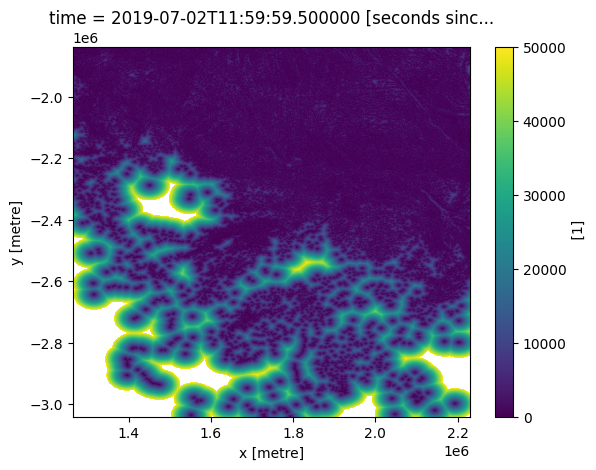

In [163]:
proximity_agg.plot()

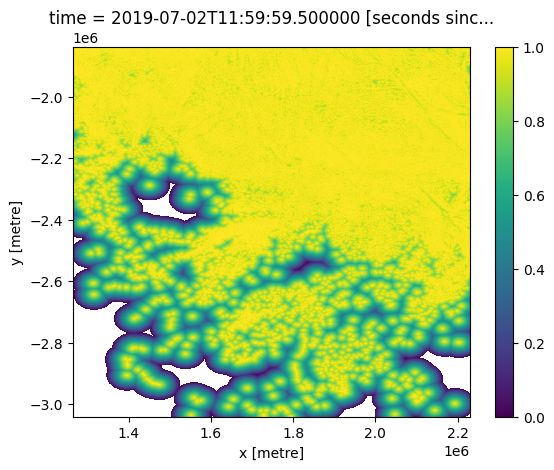

In [164]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [165]:
# importing population density data

In [166]:
import rioxarray as rxr
import matplotlib.pyplot as plt

from deafrica_tools.plotting import display_map

In [167]:
# set s3 region for HRSL data access

In [168]:
import os
os.environ['AWS_DEFAULT_REGION']="us-east-1"
os.environ['AWS_S3_ENDPOINT']="s3.us-east-1.amazonaws.com"

In [169]:
# Set the central latitude and longitude
central_lat = -18.758429
central_lon = 16.267786

# Set the buffer to load around the central coordinates.
buffer = 0.5

# Compute the bounding box for the study area. 
xmin, xmax = central_lon - buffer, central_lon + buffer
ymin, ymax = central_lat - buffer, central_lat + buffer
bbox = (xmin, ymin, xmax, ymax)

In [170]:
display_map(x=(xmin, xmax), y=(ymin, ymax))

In [171]:
# loading general population data

In [172]:
ds_general = rxr.open_rasterio('s3://dataforgood-fb-data/hrsl-cogs/hrsl_general/hrsl_general-latest.vrt', chunks ={'x': 1000, 'y': 1000})

In [173]:
# running euclidean distance on population density

In [174]:
# load the data within area of interest

pop_general = ds_general.isel(band=0).sel(x=slice(xmin, xmax), y = slice(ymax, ymin)).compute()

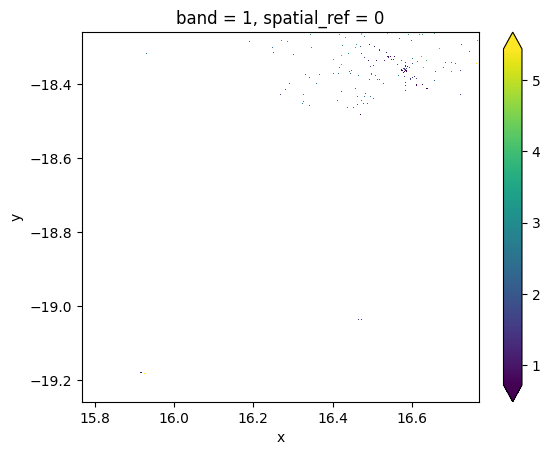

In [175]:
pop_general.plot.imshow(robust=True);

In [176]:
proximity_agg = proximity(pop_general, max_distance=0.5, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 3600, x: 3600)>
array([[0.05886006, 0.05877675, 0.05869465, ..., 0.00509932, 0.00534316,
        0.00559017],
       [0.05859531, 0.05851163, 0.05842916, ..., 0.00496904, 0.00521897,
        0.00547159],
       [0.05833069, 0.05824663, 0.05816377, ..., 0.00485118, 0.00510688,
        0.00536478],
       ...,
       [0.16001567, 0.15978476, 0.15955402, ..., 0.28013238, 0.28025562,
        0.28037906],
       [0.16017014, 0.15993947, 0.15970893, ..., 0.2803814 , 0.28050452,
        0.28062788],
       [0.16032495, 0.1600945 , 0.15986419, ..., 0.2806305 , 0.2807535 ,
        0.28087676]], dtype=float32)
Coordinates:
    band         int64 1
  * x            (x) float64 15.77 15.77 15.77 15.77 ... 16.77 16.77 16.77 16.77
  * y            (y) float64 -18.26 -18.26 -18.26 ... -19.26 -19.26 -19.26
    spatial_ref  int64 0
Attributes:
    _FillValue:    nan
    scale_factor:  1.0
    add_offset:    0.0

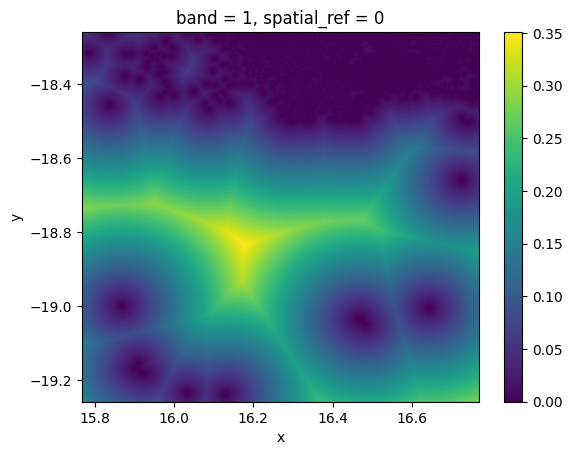

In [177]:
proximity_agg.plot()

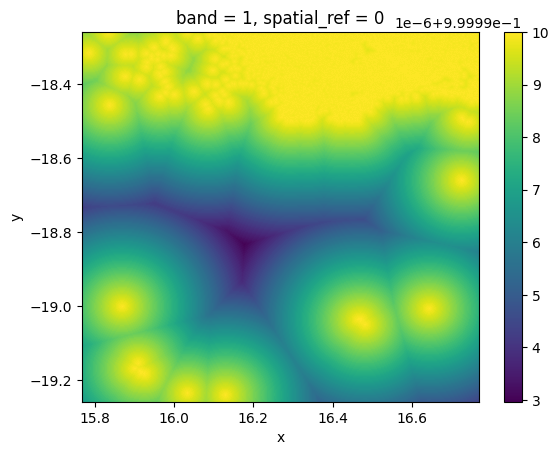

In [178]:
proximity_aggstd = 1 - (proximity_agg/50000)

proximity_aggstd.plot()

In [179]:
# loading in roads data

In [180]:
try:
    import osmnx as ox
except:
    import os
    os.system('pip install osmnx')
    import osmnx as ox

In [181]:
import geopandas as gpd

In [182]:
ox.settings.cache_folder='/tmp/cache/'

In [183]:
# Set the central latitude and longitude.
central_lat = -18.758429
central_lon = 16.267786

# Set the buffer to load around the central coordinates.
buffer = 0.5

# Compute the bounding box for the study area. 
xmin, xmax = central_lon - buffer, central_lon + buffer
ymin, ymax = central_lat - buffer, central_lat + buffer

In [184]:
display_map(x=(xmin, xmax), y=(ymin, ymax))

In [185]:
# tags for buildings
tags = {'building': True}

In [186]:
#noting the order of the bounds provided
geometries = ox.geometries_from_bbox(ymax, ymin, xmax, xmin, tags)

In [187]:
#print the first few rows
geometries.head()

nodes  \
element_type osmid                                                          
way          224860016  [2337091359, 2337091350, 2337091349, 233709135...   
             224860018  [2337091679, 2337091672, 2337091676, 233709168...   
             224860020  [2337091311, 2337091295, 2337091297, 233709131...   
             224860021  [2337091381, 2337091372, 2337091370, 233709137...   
             224860023  [2337091321, 2337091314, 2337091317, 233709132...   

                       building  \
element_type osmid                
way          224860016      yes   
             224860018      yes   
             224860020      yes   
             224860021      yes   
             224860023      yes   

                                                                 geometry  \
element_type osmid                                                          
way          224860016  POLYGON ((16.46431 -19.03580, 16.46430 -19.035...   
             224860018  POLYGON ((16.48152 -19.04839, 16.48161 -19.048...   
             224860020  POLYGON ((16.46506 -19.03542, 16.46508 -19.035...   
             224860021  POLYGON ((16.46456 -19.03601, 16.46454 -19.035...   
             224860023  POLYGON ((16.46425 -19.03553, 16.46429 -19.035...   

                       amenity name  ref tourism layer wikidata addr:city  \
element_type osmid                                                          
way          224860016     NaN  NaN  NaN     NaN   NaN      NaN       NaN   
             224860018     NaN  NaN  NaN     NaN   NaN      NaN       NaN   
             224860020     NaN  NaN  NaN     NaN   NaN      NaN       NaN   
             224860021     NaN  NaN  NaN     NaN   NaN      NaN       NaN   
             224860023     NaN  NaN  NaN     NaN   NaN      NaN       NaN   

                        ... content landuse height ways type source  \
element_type osmid      ...                                           
way          224860016  ...     NaN     NaN    NaN  NaN  NaN    NaN   
             224860018  ...     NaN     NaN    NaN  NaN  NaN    NaN   
             224860020  ...     NaN     NaN    NaN  NaN  NaN    NaN   
             224860021  ...     NaN     NaN    NaN  NaN  NaN    NaN   
             224860023  ...     NaN     NaN    NaN  NaN  NaN    NaN   

                       changing_table  fee diet:vegetarian addr:housename  
element_type osmid                                                         
way          224860016            NaN  NaN             NaN            NaN  
             224860018            NaN  NaN             NaN            NaN  
             224860020            NaN  NaN             NaN            NaN  
             224860021            NaN  NaN             NaN            NaN  
             224860023            NaN  NaN             NaN            NaN  

[5 rows x 29 columns]

In [188]:
# selected types of roads
tags = {'highway': ['motorway', 'motorway_link', 'primary', 'primary_link',
                    'secondary', 'secondary_link', 'tertiary', 'tertiary_link', 
                    'residential', 'pedestrian']}

In [189]:
#noting the order of the bounds provided
geometries = ox.geometries_from_bbox(ymax, ymin, xmax, xmin, tags)

In [190]:
#print the first few rows
geometries.head()

access bicycle foot  \
element_type osmid                          
way          23908661    NaN      no   no   
             23910266    NaN      no   no   
             23910273    NaN      no   no   
             23911018    NaN      no   no   
             23990231    NaN     NaN  NaN   

                                                                geometry  \
element_type osmid                                                         
way          23908661  LINESTRING (16.69915 -18.93154, 16.69848 -18.9...   
             23910266  LINESTRING (16.40422 -18.99518, 16.40749 -18.9...   
             23910273  LINESTRING (16.47141 -19.03268, 16.47151 -19.0...   
             23911018  LINESTRING (16.55633 -18.99768, 16.55659 -18.9...   
             23990231  LINESTRING (16.47133 -19.03207, 16.47149 -19.0...   

                                                                   nodes  \
element_type osmid                                                         
way          23908661  [2339309019, 2339309016, 259148588, 259148589,...   
             23910266  [89025415, 4189911984, 288565416, 3507157286, ...   
             23910273  [259162877, 4876722120, 259163177, 2337091176,...   
             23911018  [2339146531, 259172086, 2339146534, 2339146535...   
             23990231  [259162805, 4876722119, 2337091171, 4876722118...   

                           highway horse maxspeed motor_vehicle surface  \
element_type osmid                                                        
way          23908661     tertiary    no       60           yes  gravel   
             23910266     tertiary    no       60           NaN  gravel   
             23910273  residential    no       60           NaN  gravel   
             23911018     tertiary    no       60           NaN  gravel   
             23990231     tertiary   NaN       60           NaN  gravel   

                      tracktype oneway   ref         name vehicle lanes  \
element_type osmid                                                        
way          23908661    grade2    NaN   NaN          NaN     NaN   NaN   
             23910266       NaN     no   C38          NaN     NaN   NaN   
             23910273    grade2     no   NaN          NaN     NaN   NaN   
             23911018    grade3    NaN  5978  Eland Drive     NaN   NaN   
             23990231    grade2     no   C38          NaN     NaN   NaN   

                      covered smoothness source:maxspeed  
element_type osmid                                        
way          23908661     NaN        NaN             NaN  
             23910266     NaN        NaN             NaN  
             23910273     NaN        NaN             NaN  
             23911018     NaN        NaN             NaN  
             23990231     NaN        NaN             NaN

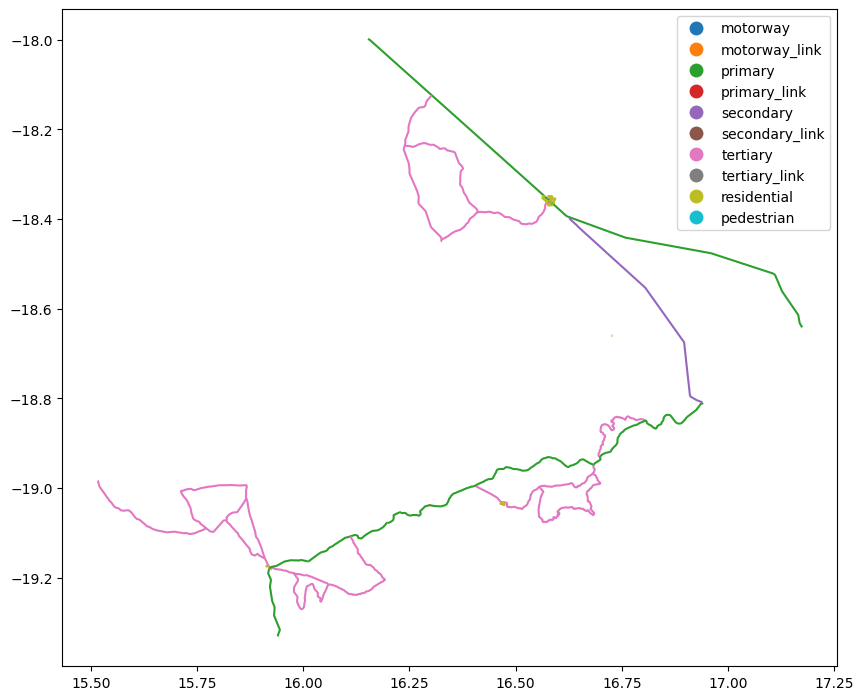

In [191]:
#visualize the geometries retrieved
geometries.plot(figsize=(10,12), cmap='tab10', column='highway', categorical=True, categories=tags['highway'], legend=True);

In [192]:
# running euclidean distance on roads

In [193]:
from deafrica_tools.spatial import xr_vectorize, xr_rasterize
xr_roads = xr_rasterize(geometries, da=ds_cgls)
xr_roads

<xarray.DataArray (y: 2405, x: 1931)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * y        (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x        (x) float64 1.264e+06 1.265e+06 1.265e+06 ... 2.229e+06 2.229e+06
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

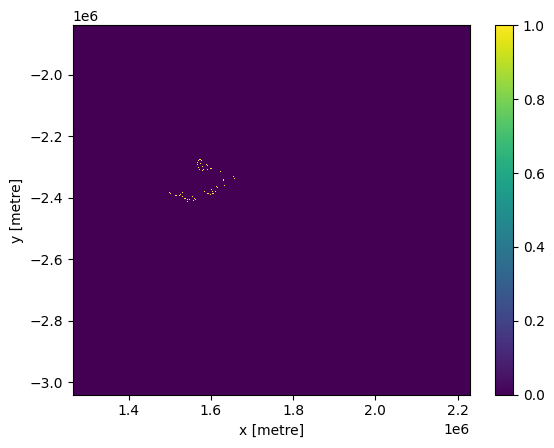

In [194]:
xr_roads.plot()

In [195]:
proximity_agg = proximity(xr_roads, max_distance=50000, distance_metric='EUCLIDEAN')
proximity_agg

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * y        (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x        (x) float64 1.264e+06 1.265e+06 1.265e+06 ... 2.229e+06 2.229e+06
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

In [196]:
#fuzzy buffer equation

In [197]:
proximity_aggstd = 1 - (proximity_agg/50000)

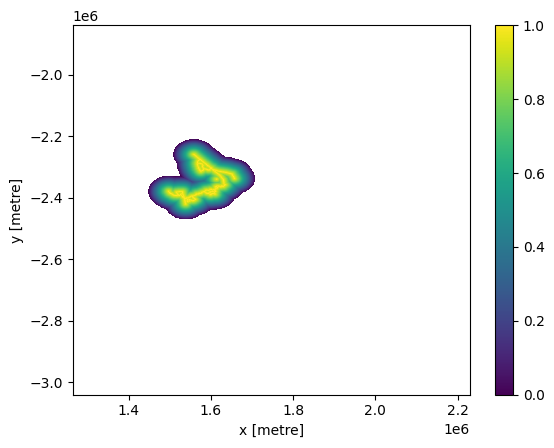

In [198]:
proximity_aggstd.plot()

In [199]:
# weighted linear combination

In [213]:
# urban development, roads, general population, cropland 
# xr_roads, pop_general, cgls_urban, cgls_crops

roads_weight=0.25
pop_weight=0.25
urban_weight=0.25
crop_weight=0.25

hp_model=(xr_roads*roads_weight)+(
    cgls_urban.classification*urban_weight)+(
    #(
   # pop_general*pop_weight)+
    
    cgls_crops.classification*crop_weight)

In [204]:
xr_roads

<xarray.DataArray (y: 2405, x: 1931)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
Coordinates:
  * y        (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x        (x) float64 1.264e+06 1.265e+06 1.265e+06 ... 2.229e+06 2.229e+06
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

In [208]:
cgls_urban.classification

<xarray.DataArray 'classification' (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    time         datetime64[ns] 2019-07-02T11:59:59.500000
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref  int32 6933
Attributes:
    units:             1
    nodata:            255
    flags_definition:  {'data': {'bits': [0, 1, 2, 3, 4, 5, 6, 7], 'values': ...
    crs:               EPSG:6933
    grid_mapping:      spatial_ref

In [206]:
cgls_crops

<xarray.Dataset>
Dimensions:         (y: 2405, x: 1931)
Coordinates:
    time            datetime64[ns] 2019-07-02T11:59:59.500000
  * y               (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x               (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    spatial_ref     int32 6933
Data variables:
    classification  (y, x) float64 nan nan nan nan nan ... nan nan nan nan nan
Attributes:
    crs:           EPSG:6933
    grid_mapping:  spatial_ref

In [207]:
pop_general

<xarray.DataArray (y: 3600, x: 3600)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    band         int64 1
  * x            (x) float64 15.77 15.77 15.77 15.77 ... 16.77 16.77 16.77 16.77
  * y            (y) float64 -18.26 -18.26 -18.26 ... -19.26 -19.26 -19.26
    spatial_ref  int64 0
Attributes:
    _FillValue:    nan
    scale_factor:  1.0
    add_offset:    0.0

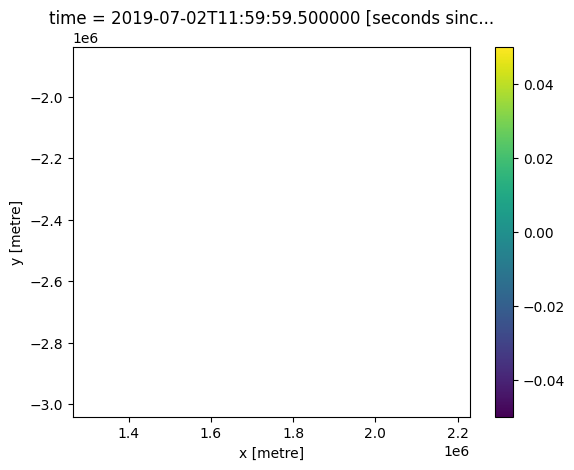

In [215]:
hp_model.plot()

In [214]:
hp_model

<xarray.DataArray (y: 2405, x: 1931)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * y            (y) float64 -1.839e+06 -1.839e+06 ... -3.04e+06 -3.041e+06
  * x            (x) float64 1.264e+06 1.265e+06 ... 2.229e+06 2.229e+06
    time         datetime64[ns] 2019-07-02T11:59:59.500000
    spatial_ref  int32 6933

In [203]:
hp_model.classification.plot()

IndexError: index -1 is out of bounds for axis 0 with size 0